# Part 1: Data Preprocessing


## 1. Downloading

In this script, we are downloading New York City taxi trip data available on the NYC government website. This data contains trip records of yellow taxis and is provided in Parquet file format. We are interested in data from 2009 to 2015 (up to June 2015).

First, we define a function called download_file(), which takes a URL and a local file path as input. It downloads the file from the given URL and saves it to the specified local path. This function will be useful for downloading taxi data files later.

Next, we define a function called get_yellow_taxi_parquet_links(). This function takes a BeautifulSoup object as input, which contains the parsed HTML content of the NYC taxi data website. It then searches for yellow taxi parquet file links within the HTML content and returns a list of those links.

We also have a test_download_file() function, which tests the download_file() function to ensure it works correctly. It creates a temporary file, downloads an example file from the internet, and checks if the file is saved locally.

After defining the functions, we send an HTTP request to the taxi data URL and parse the HTML content using the BeautifulSoup library. We then use the get_yellow_taxi_parquet_links() function to extract yellow taxi parquet file links from the parsed HTML content.

To store the downloaded files, we create a directory named "yellow_taxi_data" if it doesn't already exist. Then, we loop through each URL in the list of yellow taxi parquet links and download the corresponding file using the download_file() function. The file name is extracted from the URL, and the local path is created by joining the directory path and file name.








In [1]:
#imports 
import os
import re
import unittest
from typing import List
from unittest.mock import patch

import requests
from bs4 import BeautifulSoup


In [2]:
# Define the URL for taxi data
taxi_data_url = "https://www1.nyc.gov/site/tlc/about/tlc-trip-record-data.page"

In [3]:
# Define functions
def download_file(url: str, local_filename: str) -> str:
    """
    Download a file from the given URL and save it to the specified local file.

    :param url: The URL of the file to download.
    :param local_filename: The path to save the downloaded file.
    :return: The path of the saved file.
    """
    # Send an HTTP request to the URL
    with requests.get(url, stream=True) as r:
        # Raise an exception if the request fails
        r.raise_for_status()
        # Save the file to the specified path
        with open(local_filename, 'wb') as f:
            # Write the content of the response in chunks
            for chunk in r.iter_content(chunk_size=8192):
                f.write(chunk)
    return local_filename

def get_yellow_taxi_parquet_links(soup: BeautifulSoup) -> List[str]:
    """
    Get yellow taxi parquet links from the BeautifulSoup object.

    :param soup: BeautifulSoup object containing the parsed HTML content.
    :return: A list of yellow taxi parquet links.
    """
    # Initialize an empty list to store the links
    yellow_taxi_parquet_links = []
    # Iterate through all 'a' tags with 'href' attribute
    for link in soup.find_all('a', href=True):
        href = link['href']
        # Check if the link matches the regex pattern
        if re.match(r'.*yellow_tripdata_(2009|2010|2011|2012|2013|2014|2015).*\.parquet', href):
            # Check if the month is between January and June for 2015 data
            if "2015" in href:
                date_part = re.search(r"(\d{4})-(\d{2})", href)
                if date_part:
                    year, month = int(date_part.group(1)), int(date_part.group(2))
                    if year == 2015 and month > 6:
                        continue
            # Add the link to the list
            yellow_taxi_parquet_links.append(href)
    return yellow_taxi_parquet_links

def test_download_file():
    import tempfile
    test_url = "https://www.example.com/"
    with tempfile.NamedTemporaryFile() as temp_file:
        local_path = temp_file.name
        assert download_file(test_url, local_path) == local_path
        assert os.path.getsize(local_path) > 0

In [4]:
# Send an HTTP request to the taxi data URL
response = requests.get(taxi_data_url)
# Parse the HTML content of the response
soup = BeautifulSoup(response.content, 'lxml')
# Get the list of yellow taxi parquet links
yellow_taxi_parquet_links = get_yellow_taxi_parquet_links(soup)

# Define the directory to store the downloaded files
yellow_taxi_data_dir = "yellow_taxi_data"
# Create the directory if it doesn't exist
os.makedirs(yellow_taxi_data_dir, exist_ok=True)

In [5]:
# Download and save each file from the list of links
for url in yellow_taxi_parquet_links:
    file_name = url.split("/")[-1]
    local_path = os.path.join(yellow_taxi_data_dir, file_name)
    print(f"Downloading {file_name} ...")
    download_file(url, local_path)
    print

## 2. Cleaning & filtering:


In this code snippet, we define a function called read_zones_from_shapefile() to read a shapefile and return a GeoDataFrame with the required columns. Shapefiles are a common file format used for storing geospatial data. In this case, we are interested in the geographic boundaries of taxi zones.

The read_zones_from_shapefile() function takes the path to the shapefile as input. It then reads the shapefile using the gpd.read_file() function from the geopandas library, which is designed to work with geospatial data.

Next, we convert the coordinate reference system of the GeoDataFrame to EPSG:4326 (WGS84), which is a commonly used coordinate reference system in GPS and other geospatial applications. This step is necessary to ensure that the coordinates are in a format that is compatible with other geospatial tools and datasets.

We then calculate the longitude and latitude for the centroid of each zone by extracting the x and y coordinates of the centroid. The centroids represent the approximate center points of the taxi zones.

Afterward, we drop unnecessary columns from the GeoDataFrame to keep only the relevant data, such as the taxi zone IDs, longitude, and latitude.

We also define a test function, test_read_zones_from_shapefile(), which tests the read_zones_from_shapefile() function. This test checks if the output is a GeoDataFrame and contains the "Lon" and "Lat" columns.

Finally, we set the path to the shapefile and read it using the read_zones_from_shapefile() function. The resulting GeoDataFrame is printed for reference.








In [5]:
import geopandas as gpd
import pandas as pd
from typing import Tuple

def read_zones_from_shapefile(shapefile_path: str) -> gpd.GeoDataFrame:
    """
    Read the shapefile and return the GeoDataFrame with the required columns.

    :param shapefile_path: The path to the shapefile.
    :return: A GeoDataFrame with the required columns.
    """
    # Read the shapefile
    zones = gpd.read_file(shapefile_path)
    
    # Convert the coordinate reference system
    zones = zones.to_crs(4326)
    
    # Calculate the longitude and latitude for each zone
    zones['Lon'] = zones.centroid.x
    zones['Lat'] = zones.centroid.y
    
    # Drop unnecessary columns
    zones = zones.drop(columns=['OBJECTID', "Shape_Leng", 'Shape_Area', "zone", 'borough', 'geometry'])
    
    return zones


In [6]:
# Set the path to shapefile
shapefile_path = "/Users/Yolanda/CU2023spring/4501 tools of python/project/yellow_taxi_data/taxi_zones/taxi_zones.shp"

# Read the GeoDataFrame from the shapefile
zones = read_zones_from_shapefile(shapefile_path)


/var/folders/0q/hysr6_zj3pz7tbmdxkl32ns00000gp/T/ipykernel_73239/1091608224.py:19: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  zones['Lon'] = zones.centroid.x
/var/folders/0q/hysr6_zj3pz7tbmdxkl32ns00000gp/T/ipykernel_73239/1091608224.py:20: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  zones['Lat'] = zones.centroid.y


###  Calculate distance（Missing data)

In this code snippet, we define a function called calculate_distance() to calculate the distance between two points on Earth, given their latitudes and longitudes. This is useful for determining the distance between taxi trip pick-up and drop-off locations, which can help in understanding trip lengths and other related factors.

The function takes the latitude and longitude of two points as input. It then approximates the Earth's radius in kilometers and converts the latitudes and longitudes from degrees to radians, which are required for trigonometric calculations.

Next, it calculates the differences in latitudes and longitudes between the two points. It then applies the Haversine formula to compute the great-circle distance between the points. The Haversine formula is used to account for the Earth's curvature, providing a more accurate distance measurement compared to using a simple Euclidean distance calculation.

After applying the Haversine formula, we calculate the distance in kilometers by multiplying the result by the Earth's radius.

We also define a test function, test_calculate_distance(), to test the calculate_distance() function. The test function calculates the distance between New York City and London and checks if the result is a float and approximately equal to 5571 km, which is the expected distance between these two cities.

By using the calculate_distance() function, we can incorporate distance calculations into our analysis of taxi trip data.

In [7]:
import math
from typing import Tuple

def calculate_distance(lat1: float, lon1: float, lat2: float, lon2: float) -> float:
    """
    Calculate the distance between two points on Earth, given their latitudes and longitudes.

    :param lat1: Latitude of the first point.
    :param lon1: Longitude of the first point.
    :param lat2: Latitude of the second point.
    :param lon2: Longitude of the second point.
    :return: The distance between the two points in kilometers.
    """
    # Approximate radius of Earth in km
    R = 6373.0

    # Convert degrees to radians
    lat1 = math.radians(lat1)
    lon1 = math.radians(lon1)
    lat2 = math.radians(lat2)
    lon2 = math.radians(lon2)

    # Calculate the differences in latitudes and longitudes
    dlon = lon2 - lon1
    dlat = lat2 - lat1

    # Apply the Haversine formula
    a = (math.sin(dlat / 2)) ** 2 + math.cos(lat1) * math.cos(lat2) * (math.sin(dlon / 2)) ** 2
    c = 2 * math.atan2(math.sqrt(a), math.sqrt(1 - a))
    
    # Calculate the distance in kilometers
    distance = R * c
    return distance


### Processing uber rides sample(csv)+Missing data


In this code snippet, we define a function called process_uber_data() to process Uber data from a given CSV file and return a DataFrame with the required columns. This function will be useful for cleaning and processing Uber data for further analysis or visualization.

First, the function reads the input CSV file and calculates the distance between pick-up and drop-off locations using the calculate_distance() function. The calculated distance is added to the DataFrame as a new column.

Next, the function defines boundaries for the coordinate box to filter trips within a specific region. The data is then filtered to remove trips outside the coordinate box and any rows with missing values. Additionally, the function drops trips with zero passenger count, fare amount, or distance.

The 'pickup_datetime' column is then converted to a pandas datetime object, and the pickup hour and day of the week are extracted. The required columns are selected and renamed to more descriptive names.

Finally, the DataFrame is sorted by pickup datetime and its index is reset before being returned.

In [8]:
def process_uber_data(csv_path: str) -> pd.DataFrame:
    """
    Process the Uber data from the given CSV file and return a DataFrame with the required columns.

    :param csv_path: The path to the CSV file.
    :return: A DataFrame with the required columns.
    """
    # Read the CSV file
    uber_data = pd.read_csv(csv_path)

    # Calculate distance and add it to the DataFrame
    uber_data['Distance'] = uber_data.apply(lambda row: calculate_distance(row['pickup_latitude'], row['pickup_longitude'],
                                                                  row['dropoff_latitude'], row['dropoff_longitude']), axis=1)

    # Define coordinate box boundaries
    lat_min, lat_max = 40.560445, 40.908524
    lng_min, lng_max = -74.242330, -73.717047

    # Filter trips within the coordinate box
    uber_data = uber_data[(uber_data['pickup_latitude'] >= lat_min) & (uber_data['pickup_latitude'] <= lat_max) &
                (uber_data['dropoff_latitude'] >= lat_min) & (uber_data['dropoff_latitude'] <= lat_max) &
                (uber_data['pickup_longitude'] >= lng_min) & (uber_data['pickup_longitude'] <= lng_max) &
                (uber_data['dropoff_longitude'] >= lng_min) & (uber_data['dropoff_longitude'] <= lng_max)]

    # Drop rows with missing values
    uber_data.dropna(axis=0, how='any', inplace=True)

    # Drop trips with zero passenger count or fare amount
    uber_data = uber_data[(uber_data["passenger_count"] != 0) & (uber_data["fare_amount"] != 0)]

    # Drop trips with zero distance
    uber_data = uber_data[uber_data["Distance"] != 0]

    # Convert 'pickup_datetime' column to pandas datetime object and extract hour and day of week
    uber_data['pickup_datetime'] = pd.to_datetime(uber_data['pickup_datetime']).dt.tz_localize(None)
    uber_data['pickup_hour'] = uber_data['pickup_datetime'].dt.hour
    uber_data['day_of_week'] = uber_data['pickup_datetime'].dt.dayofweek

    # Select required columns and rename them
    uber_data = uber_data[['pickup_datetime', 'pickup_hour', 'day_of_week', 'pickup_longitude', 'pickup_latitude',
                           'dropoff_longitude', 'dropoff_latitude', "Distance"]]
    uber_data.rename(columns={
            'pickup_longitude': 'Start_Lon',
            'pickup_latitude': 'Start_Lat',
            'dropoff_longitude': 'End_Lon',
            'dropoff_latitude': 'End_Lat',
            'Distance': 'Trip_Distance',
            'pickup_datetime': 'Pickup_Datetime'
        }, inplace=True)

    # Sort by pickup datetime and reset index
    uber_data = uber_data.sort_values(by='Pickup_Datetime').reset_index(drop=True)
    
    # Add 'id' column and replace index column
    uber_data.reset_index(drop=False, inplace=True)
    uber_data.rename(columns={'index': 'id'}, inplace=True)
    uber_data['id'] += 1

    return uber_data

def test_process_uber_data():
    test_csv_path = "/Users/Yolanda/CU2023spring/4501 tools of python/project/yellow_taxi_data/uber_rides_sample.csv"
    
    if os.path.exists(test_csv_path):
        processed_data = process_uber_data(test_csv_path)
        assert isinstance(processed_data, pd.DataFrame)
        assert "Pickup_Datetime" in processed_data.columns
        assert "Start_Lon" in processed_data.columns
        assert "Start_Lat" in processed_data.columns
    else:
        print("Test CSV file not found, skipping test.")


In [9]:
#save the processed data to a new CSV file
def save_processed_data(processed_data: pd.DataFrame, output_csv_path: str) -> None:
    """
    Save the processed Uber data to a new CSV file.

    :param processed_data: The DataFrame containing the processed data.
    :param output_csv_path: The path to the output CSV file.
    """
    processed_data.to_csv(output_csv_path, index=False)


In [10]:
# Usage of the functions:
input_csv_path = "/Users/Yolanda/CU2023spring/4501 tools of python/project/yellow_taxi_data/uber_rides_sample.csv"
output_csv_path = "/Users/Yolanda/CU2023spring/4501 tools of python/project/yellow_taxi_data/processed_uber_rides_sample.csv"

uber_data = process_uber_data(input_csv_path)
save_processed_data(uber_data, output_csv_path)


In [11]:
# Run test functions here to check if everything is working correctly.
test_process_uber_data()

### Processing yellow_taxi files+Sampling+Missing data

In summary, we've processed the Yellow Taxi data for years 2009 to 2015. For each year, we've:

Filtered and cleaned the data, removing rows with zero passenger count, fare amount, or tip amount.
Dropped unnecessary columns.
Filtered out trips that start and/or end outside of the defined latitude/longitude bounds.
Filtered out rows with the same pickup and dropoff location.
Selected necessary columns.
Dropped rows with missing values.
Next, we created functions to load and concatenate Parquet files into a single DataFrame, and sort the DataFrame by a datetime column while resetting the index.

Finally, we used the functions to load and concatenate the processed Parquet files for years 2009 to 2015, sorted the DataFrame, and reset the index.






#### clean the data for year 2009

In [63]:
def process_dataframe_2009(raw_dataframe_2009: pd.DataFrame) -> pd.DataFrame:
    """
    Process the input DataFrame for year 2009 and clean the data.

    :param raw_dataframe_2009: The DataFrame containing the raw data for year 2009.
    :return: A cleaned DataFrame with the required columns.
    """
    # Drop trips with zero passenger count
    cleaned_df_2009 = raw_dataframe_2009[raw_dataframe_2009['Passenger_Count'] != 0]
    # Drop trips with no fare
    cleaned_df_2009 = cleaned_df_2009[cleaned_df_2009['Fare_Amt'] != 0]
    cleaned_df_2009 = cleaned_df_2009[cleaned_df_2009['Tip_Amt'] != 0]

    # Drop unnecessary columns
    cleaned_df_2009 = cleaned_df_2009.drop(columns=["vendor_name", "Passenger_Count", "Rate_Code","store_and_forward", "Payment_Type", 
                          "surcharge", "mta_tax", "Tolls_Amt", "Total_Amt","Trip_Dropoff_DateTime","Fare_Amt"])

    # Filter out trips that start and/or end outside of the defined latitude/longitude bounds
    lat_min, lat_max = 40.560445, 40.908524
    lng_min, lng_max = -74.242330, -73.717047
    cleaned_df_2009 = cleaned_df_2009[(cleaned_df_2009['Start_Lat'] >= lat_min) & (cleaned_df_2009['Start_Lat'] <= lat_max) &
            (cleaned_df_2009['End_Lat'] >= lat_min) & (cleaned_df_2009['End_Lat'] <= lat_max) &
            (cleaned_df_2009['Start_Lon'] >= lng_min) & (cleaned_df_2009['Start_Lon'] <= lng_max) &
            (cleaned_df_2009['End_Lon'] >= lng_min) & (cleaned_df_2009['End_Lon'] <= lng_max)]

    # Filter out rows with the same pickup and dropoff location
    cleaned_df_2009 = cleaned_df_2009[(cleaned_df_2009['Start_Lon'] != cleaned_df_2009['End_Lon']) &(cleaned_df_2009['Start_Lat'] != cleaned_df_2009['End_Lat'])]

    cleaned_df_2009.rename(columns = {'Trip_Pickup_DateTime':'Pickup_Datetime',
                         "Trip_Dropoff_DateTime":"Dropoff_Datetime",
                        },inplace = True)

    # Select necessary columns
    cleaned_df_2009 = cleaned_df_2009.loc[:, ["Pickup_Datetime","Trip_Distance","Start_Lon",
                    "Start_Lat","End_Lon","End_Lat","Tip_Amt"]]

    # Drop NA
    cleaned_df_2009.dropna(inplace=True)

    return cleaned_df_2009


In [64]:
def process_data_2009(year: int, sample_size: int):
    """
    Process the data for the specified year and sample size.

    :param year: The year of the data to process.
    :param sample_size: The sample size to use for each month's data.
    """
    # Define the file paths for each month for the specified year
    file_paths = [f'/Users/Yolanda/CU2023spring/4501 tools of python/project/yellow_taxi_data/yellow_tripdata_{year}-{month:02}.parquet' for month in range(1, 13)]

    all_dfs_2009 = []

    for file_path in file_paths:
        # Load the entire dataset
        entire_df_2009 = pd.read_parquet(file_path)

        # Process the entire dataset
        cleaned_entire_df_2009 = process_dataframe_2009(entire_df_2009)

        # Sample the cleaned dataframe
        sampled_df_2009 = cleaned_entire_df_2009.sample(n=sample_size, random_state=42)

        all_dfs_2009.append(sampled_df_2009)

    final_df_2009 = pd.concat(all_dfs_2009, ignore_index=True)
    output_file_path = f'/Users/Yolanda/CU2023spring/4501 tools of python/project/yellow_taxi_data/cleaned_yellow_tripdata_{year}.parquet'
    final_df_2009.to_parquet(output_file_path)

# Set the sample size
sample_size = 2500

# Process the data for the year 2009
process_data_2009(2009, sample_size)


In [65]:
file_path = "/Users/Yolanda/CU2023spring/4501 tools of python/project/yellow_taxi_data/cleaned_yellow_tripdata_2009.parquet"
df = pd.read_parquet(file_path)
print("Length of the data in cleaned_yellow_tripdata_2009.parquet:", len(df))

Length of the data in cleaned_yellow_tripdata_2009.parquet: 30000


In [41]:
# Test function 
import os

def test_process_data_2009():
    """
    Test the process_data function for years 2009
    """
    sample_size = 10
    year = 2009
    process_data_2009(year, sample_size)
    
    output_file_path = f'/Users/Yolanda/CU2023spring/4501 tools of python/project/yellow_taxi_data/test_cleaned_yellow_tripdata_{year}.parquet'
    
    # Check if the output file is created
    assert os.path.exists(output_file_path)
    
    # Load the output file and check the number of rows
    test_df = pd.read_parquet(output_file_path)
    assert len(test_df) == sample_size * 12  # 12 months of data

# Run the test function
test_process_data_2009()


#### clean the data for year 2010

In [66]:
def process_dataframe_2010(df: pd.DataFrame) -> pd.DataFrame:
    """
    Clean the dataframe for year 2010.

    :param df: The input dataframe to clean.
    :return: The cleaned dataframe.
    """
    # Drop trips with zero passenger count
    df = df[df['passenger_count'] != 0]

    # Drop trips with no fare
    df = df[df['fare_amount'] != 0]
    df = df[df['tip_amount'] != 0]

    # Drop unnecessary columns
    df = df.drop(columns=["vendor_id", "passenger_count", "rate_code", "dropoff_datetime", "fare_amount",
                          "store_and_fwd_flag", "payment_type", "surcharge", "mta_tax", "tolls_amount", "total_amount"])

    df.rename(columns={'pickup_datetime': 'Pickup_Datetime',
                       "dropoff_datetime": "Dropoff_Datetime",
                       "trip_distance": "Trip_Distance",
                       "fare_amount": "Fare_Amt",
                       "tip_amount": "Tip_Amt",
                       "pickup_longitude": "Start_Lon",
                       "pickup_latitude": "Start_Lat",
                       "dropoff_longitude": "End_Lon",
                       "dropoff_latitude": "End_Lat"
                       }, inplace=True)

    # Filter out trips that start and/or end outside of the defined latitude/longitude bounds
    # Define the latitude/longitude bounds
    lat_min, lat_max = 40.560445, 40.908524
    lng_min, lng_max = -74.242330, -73.717047
    df = df[(df['Start_Lat'] >= lat_min) & (df['Start_Lat'] <= lat_max) &
            (df['End_Lat'] >= lat_min) & (df['End_Lat'] <= lat_max) &
            (df['Start_Lon'] >= lng_min) & (df['Start_Lon'] <= lng_max) &
            (df['End_Lon'] >= lng_min) & (df['End_Lon'] <= lng_max)]

    # Filter out rows with the same pickup and dropoff location
    df = df[(df['Start_Lon'] != df['End_Lon']) & (df['Start_Lat'] != df['End_Lat'])]

    # Select necessary columns
    df = df.loc[:, ["Pickup_Datetime", "Trip_Distance", "Start_Lon",
                    "Start_Lat", "End_Lon", "End_Lat", "Tip_Amt"]]

    # Remove NaN
    df.dropna()

    return df



In [67]:
def process_data_2010(year: int, sample_size: int):
    """
    Process the data for the specified year and sample size.

    :param year: The year of the data to process.
    :param sample_size: The sample size to use for each month's data.
    """
    # Define the file paths for each month for the specified year
    file_paths = [f'/Users/Yolanda/CU2023spring/4501 tools of python/project/yellow_taxi_data/yellow_tripdata_{year}-{month:02}.parquet' for month in range(1, 13)]

    all_dfs_2010 = []

    for file_path in file_paths:
        # Load the entire dataset
        entire_df_2010 = pd.read_parquet(file_path)

        # Process the entire dataset
        cleaned_entire_df_2010 = process_dataframe_2010(entire_df_2010)

        # Sample the cleaned dataframe
        sampled_df_2010 = cleaned_entire_df_2010.sample(n=sample_size, random_state=42)

        all_dfs_2010.append(sampled_df_2010)

    final_df_2010 = pd.concat(all_dfs_2010, ignore_index=True)
    output_file_path = f'/Users/Yolanda/CU2023spring/4501 tools of python/project/yellow_taxi_data/cleaned_yellow_tripdata_{year}.parquet'
    final_df_2010.to_parquet(output_file_path)

#Set the sample size
sample_size = 2500

#Process the data for the year 2010
process_data_2010(2010, sample_size)



In [68]:
file_path = "/Users/Yolanda/CU2023spring/4501 tools of python/project/yellow_taxi_data/cleaned_yellow_tripdata_2010.parquet"
df = pd.read_parquet(file_path)
print("Length of the data in cleaned_yellow_tripdata_2010.parquet:", len(df))

Length of the data in cleaned_yellow_tripdata_2010.parquet: 30000


In [45]:
# Test function 
import os

def test_process_data_2010():
    """
    Test the process_data function for years 2010
    """
    sample_size = 10
    year = 2010
    process_data_2010(year, sample_size)
    
    output_file_path = f'/Users/Yolanda/CU2023spring/4501 tools of python/project/yellow_taxi_data/test_cleaned_yellow_tripdata_{year}.parquet'
    
    # Check if the output file is created
    assert os.path.exists(output_file_path)
    
    # Load the output file and check the number of rows
    test_df = pd.read_parquet(output_file_path)
    assert len(test_df) == sample_size * 12  # 12 months of data

# Run the test function
test_process_data_2010()


#### clean the data for year 2011-2014

In [69]:
def process_dataframe_2011_2014(raw_data: pd.DataFrame) -> pd.DataFrame:
    """
    Clean and preprocess the given taxi data DataFrame.

    :param raw_data: Input taxi data DataFrame.
    :return: Cleaned and preprocessed taxi data DataFrame.
    """
    # Drop trips with zero passenger count
    valid_passengers = raw_data[raw_data['passenger_count'] != 0]

    # Drop trips with no fare
    valid_fare = valid_passengers[valid_passengers['fare_amount'] != 0]
    valid_tip = valid_fare[valid_fare['tip_amount'] != 0]

    # Drop unnecessary columns
    reduced_columns = valid_tip.drop(columns=["tolls_amount", "mta_tax", "extra", "VendorID", "passenger_count", "tpep_dropoff_datetime",
                          "RatecodeID", "store_and_fwd_flag", "payment_type", "improvement_surcharge",
                          "total_amount", "congestion_surcharge", "airport_fee", "fare_amount"])

    # Merge with location id and id
    pickup_locations = reduced_columns.drop_duplicates().merge(zones, left_on='PULocationID', right_on="LocationID",
          how='left').rename(columns={'Lon':'Start_Lon', "Lat":"Start_Lat"}).drop(columns=["PULocationID", "LocationID"])
    cleaned_data = pickup_locations.merge(zones, left_on='DOLocationID', right_on="LocationID", how='left'
          ).rename(columns={'Lon':'End_Lon', "Lat":"End_Lat"}).drop(columns=["DOLocationID", "LocationID"])

    cleaned_data.rename(columns={'tpep_pickup_datetime':'Pickup_Datetime',
                                  "trip_distance" : "Trip_Distance",
                                  "tip_amount" : "Tip_Amt"
                                 }, inplace=True)

    # Define the latitude/longitude bounds
    lat_min, lat_max = 40.560445, 40.908524
    lng_min, lng_max = -74.242330, -73.717047

    cleaned_data = cleaned_data[(cleaned_data['Start_Lat'] >= lat_min) & (cleaned_data['Start_Lat'] <= lat_max) &
                        (cleaned_data['End_Lat'] >= lat_min) & (cleaned_data['End_Lat'] <= lat_max) &
                        (cleaned_data['Start_Lon'] >= lng_min) & (cleaned_data['Start_Lon'] <= lng_max) &
                        (cleaned_data['End_Lon'] >= lng_min) & (cleaned_data['End_Lon'] <= lng_max)]

    # Filter out rows with the same pickup and dropoff location
    cleaned_data = cleaned_data[(cleaned_data['Start_Lon'] != cleaned_data['End_Lon']) &
                                 (cleaned_data['Start_Lat'] != cleaned_data['End_Lat'])]

    cleaned_data = cleaned_data.reindex(columns=["Pickup_Datetime", "Trip_Distance", "Start_Lon",
                                                 "Start_Lat", "End_Lon", "End_Lat", "Tip_Amt"])

    # Drop rows with missing values
    cleaned_data.dropna(inplace=True)

    return cleaned_data



In [70]:
def process_data_2011_2014(start_year: int, end_year: int, sample_size: int) -> None:
    """
    Process and save the cleaned taxi data for the specified years.

    :param start_year: Starting year for the data.
    :param end_year: Ending year for the data.
    :param sample_size: Number of samples per month.
    """
    all_dfs = []

    for year in range(start_year, end_year+1):
        # Define the file paths for each month for the specified year
        file_paths = [f'/Users/Yolanda/CU2023spring/4501 tools of python/project/yellow_taxi_data/yellow_tripdata_{year}-{month:02}.parquet' for month in range(1, 13)]

        year_dfs = []
        for file_path in file_paths:
            # Load the entire dataset
            entire_df = pd.read_parquet(file_path)

            # Process the entire dataset
            cleaned_entire_df = process_dataframe_2011_2014(entire_df)

            # Sample the cleaned dataframe
            sampled_df = cleaned_entire_df.sample(n=sample_size, random_state=42)

            year_dfs.append(sampled_df)

        # Concatenate all sampled dataframes for the year
        year_df = pd.concat(year_dfs, ignore_index=True)

        all_dfs.append(year_df)

    # Concatenate all sampled dataframes for all years
    final_df = pd.concat(all_dfs, ignore_index=True)

    output_file_path = f'/Users/Yolanda/CU2023spring/4501 tools of python/project/yellow_taxi_data/cleaned_yellow_tripdata_{start_year}-{end_year}.parquet'
    final_df.to_parquet(output_file_path)

start_year = 2011
end_year = 2014
sample_size = 2500

process_data_2011_2014(start_year, end_year, sample_size)


In [71]:
file_path = "/Users/Yolanda/CU2023spring/4501 tools of python/project/yellow_taxi_data/cleaned_yellow_tripdata_2011-2014.parquet"
df = pd.read_parquet(file_path)
print("Length of the data in cleaned_yellow_tripdata_2011-2014.parquet:", len(df))


Length of the data in cleaned_yellow_tripdata_2011-2014.parquet: 120000


In [49]:
def test_process_data_2011_2014():
    """
    Test the process_data function for years 2011-2014
    """
    start_year = 2011
    end_year = 2014
    sample_size = 10
    process_data_2011_2014(start_year, end_year, sample_size)

    output_file_path = f'/Users/Yolanda/CU2023spring/4501 tools of python/project/yellow_taxi_data/test_cleaned_yellow_tripdata_{start_year}-{end_year}.parquet'

    # Check if the output file is created
    assert os.path.exists(output_file_path)

    # Load the output file and check the number of rows
    test_df = pd.read_parquet(output_file_path)
    total_months = (end_year - start_year + 1) * 12
    assert len(test_df) == sample_size * total_months  # total months of data

# Run the test function
test_process_data_2011_2014()


#### clean the data for year 2015

In [72]:
def process_dataframe_2015(df: pd.DataFrame) -> pd.DataFrame:
    """
    Clean the dataframe for year 2015.

    :param df: The input dataframe
    :return: The cleaned dataframe
    """
    # Drop trips with zero passenger count
    df = df[df['passenger_count'] != 0]
    
    # Drop trips with no fare
    df = df[df['fare_amount'] != 0]
    df = df[df['tip_amount'] != 0]

    # Drop unnecessary columns
    df.drop(columns=["tolls_amount", "mta_tax", "extra", "VendorID", "passenger_count", "tpep_dropoff_datetime",
                     "RatecodeID", "store_and_fwd_flag", "payment_type", "improvement_surcharge",
                     "total_amount", "congestion_surcharge", "airport_fee", "fare_amount"], inplace=True)

    # Combine with location id and id
    df2 = df.drop_duplicates().merge(zones, left_on='PULocationID', right_on="LocationID",
                                     how='left').rename(columns={'Lon': 'Start_Lon', "Lat": "Start_Lat"}).drop(
        columns=["PULocationID", "LocationID"])
    clean_data = df2.merge(zones, left_on='DOLocationID', right_on="LocationID", how='inner'
                           ).rename(columns={'Lon': 'End_Lon', "Lat": "End_Lat"}).drop(columns=["DOLocationID", "LocationID"])

    clean_data.rename(columns={'tpep_pickup_datetime': 'Pickup_Datetime',
                               "tpep_dropoff_datetime": "Dropoff_Datetime",
                               "trip_distance": "Trip_Distance",
                               "fare_amount": "Fare_Amt",
                               "tip_amount": "Tip_Amt"
                               }, inplace=True)

    # Define the latitude/longitude bounds
    lat_min, lat_max = 40.560445, 40.908524
    lng_min, lng_max = -74.242330, -73.717047
    # Filter out trips that start and/or end outside of the defined latitude/longitude bounds
    clean_data = clean_data[(clean_data['Start_Lat'] >= lat_min) & (clean_data['Start_Lat'] <= lat_max) &
                            (clean_data['End_Lat'] >= lat_min) & (clean_data['End_Lat'] <= lat_max) &
                            (clean_data['Start_Lon'] >= lng_min) & (clean_data['Start_Lon'] <= lng_max) &
                            (clean_data['End_Lon'] >= lng_min) & (clean_data['End_Lon'] <= lng_max)]

    # Filter out rows with the same pickup and dropoff location
    clean_data = clean_data[(clean_data['Start_Lon'] != clean_data['End_Lon']) &
                            (clean_data['Start_Lat'] != clean_data['End_Lat'])]

    clean_data = clean_data[["Pickup_Datetime", "Trip_Distance", "Start_Lon",
                             "Start_Lat", "End_Lon", "End_Lat", "Tip_Amt"]]

    clean_data.dropna(inplace=True)
    return clean_data



In [73]:
def process_data_2015(year: int, sample_size: int) -> None:
    """
    Process data for the year 2015.

    :param year: The year of data to process
    :param sample_size: The number of samples to take for each month
    :return: None
    """
    # Define the file paths for each month for the specified year
    file_paths = [f'/Users/Yolanda/CU2023spring/4501 tools of python/project/yellow_taxi_data/yellow_tripdata_{year}-{month:02}.parquet' for month in range(1, 7)]

    all_dfs = []

    for file_path in file_paths:
        # Load the entire dataset
        entire_df = pd.read_parquet(file_path)

        # Process the entire dataset
        cleaned_entire_df = process_dataframe_2015(entire_df)

        # Sample the cleaned dataframe
        sampled_df = cleaned_entire_df.sample(n=sample_size, random_state=42)

        all_dfs.append(sampled_df)

    final_df = pd.concat(all_dfs, ignore_index=True)
    output_file_path = f'/Users/Yolanda/CU2023spring/4501 tools of python/project/yellow_taxi_data/cleaned_yellow_tripdata_{year}.parquet'
    final_df.to_parquet(output_file_path)

# Set the sample size
sample_size = 2500

# Process the data for the year 2015
process_data_2015(2015, sample_size)


In [74]:
file_path = "/Users/Yolanda/CU2023spring/4501 tools of python/project/yellow_taxi_data/cleaned_yellow_tripdata_2015.parquet"
df = pd.read_parquet(file_path)
print("Length of the data in cleaned_yellow_tripdata_2015.parquet:", len(df))


Length of the data in cleaned_yellow_tripdata_2015.parquet: 15000


In [54]:
def test_process_data_2015():
    """
    Test the process_data function for the year 2015
    """
    year = 2015
    sample_size = 10
    process_data_2015(year, sample_size)

    output_file_path = f'/Users/Yolanda/CU2023spring/4501 tools of python/project/yellow_taxi_data/test_cleaned_yellow_tripdata_{year}.parquet'

    # Check if the output file is created
    assert os.path.exists(output_file_path)

    # Load the output file and check the number of rows
    test_df = pd.read_parquet(output_file_path)
    total_months = 6  # Since the data for 2015 is available for 6 months only
    assert len(test_df) == sample_size * total_months  # total months of data

# Run the test function
test_process_data_2015()


### Combine all the cleaned yellow taxi data together

In [12]:
def load_and_concatenate_parquets(file_paths: List[str]) -> pd.DataFrame:
    """
    Load Parquet files from the given file paths and concatenate them into a single DataFrame.

    Args:
        file_paths (List[str]): List of file paths to the Parquet files.

    Returns:
        pd.DataFrame: A concatenated DataFrame containing data from all the Parquet files.
    """
    # Load all the Parquet files into a list of dataframes
    dfs = [pd.read_parquet(f) for f in file_paths]

    # Concatenate all the dataframes together
    combined_data = pd.concat(dfs)

    return combined_data

def sort_and_reset_index(df: pd.DataFrame, datetime_column: str) -> pd.DataFrame:
    """
    Sort the DataFrame by a datetime column and reset the index.

    Args:
        df (pd.DataFrame): The input DataFrame.
        datetime_column (str): The name of the datetime column to sort by.

    Returns:
        pd.DataFrame: The sorted DataFrame with reset index.
    """
    # Convert the integer column to datetime format
    df[datetime_column] = pd.to_datetime(df[datetime_column])

    # Sort the DataFrame by the datetime column
    df = df.sort_values(by=datetime_column)

    # Reset the index
    df = df.reset_index(drop=True)

    return df

# List all the file paths
file_list = [
    "/Users/Yolanda/CU2023spring/4501 tools of python/project/yellow_taxi_data/cleaned_yellow_tripdata_2009.parquet",
    "/Users/Yolanda/CU2023spring/4501 tools of python/project/yellow_taxi_data/cleaned_yellow_tripdata_2010.parquet",
    "/Users/Yolanda/CU2023spring/4501 tools of python/project/yellow_taxi_data/cleaned_yellow_tripdata_2011-2014.parquet",
    "/Users/Yolanda/CU2023spring/4501 tools of python/project/yellow_taxi_data/cleaned_yellow_tripdata_2015.parquet"
]

# Load and concatenate the Parquet files
yellow_taxi_data = load_and_concatenate_parquets(file_list)

# Sort the DataFrame and reset the index
yellow_taxi_data = sort_and_reset_index(yellow_taxi_data, 'Pickup_Datetime')

# Add 'id' column and replace index column
yellow_taxi_data.reset_index(drop=False, inplace=True)
yellow_taxi_data.rename(columns={'index': 'id'}, inplace=True)
yellow_taxi_data['id'] += 1


## Processing weather data
In summary, we have processed the weather data for years 2009 to 2015. The steps involved are:

1.Read CSV files into a DataFrame, filtering the required columns, and concatenate all the filtered DataFrames together.

2.Keep only rows with minute equal to 51（because it is commonly used in every hour, which can be the symbol for every hour）, reset index, and modify the 'HourlyPrecipitation' column.

3.Save the modified DataFrame as a new CSV file.

Next, we created functions to read hourly weather data from CSV files and filter the required columns. We kept only rows with minute equal to 51, reset the index, and modified the 'HourlyPrecipitation' and 'HourlyWindSpeed' columns. Then, we grouped the hourly weather data by day and calculated the mean precipitation and wind speed, and stored it in a new DataFrame called daily_weather_data.

In [14]:
import glob
import pandas as pd
from typing import List


def read_weather_data(file_list: List[str]) -> pd.DataFrame:
    """
    Read CSV files into a DataFrame, filter the required columns,
    and concatenate all the filtered DataFrames together.
    """
    dfs = []
    for file in file_list:
        df = pd.read_csv(file)
        df['DATE'] = pd.to_datetime(df['DATE'])
        df_filtered = df[['DATE', 'HourlyPrecipitation', 'HourlyWindSpeed']]
        dfs.append(df_filtered)
    weather = pd.concat(dfs)
    return weather


def filter_weather_data(weather: pd.DataFrame) -> pd.DataFrame:
    """
    Keep only rows with minute equal to 51, reset index, and modify the 'HourlyPrecipitation' column.
    """
    weather = weather[weather['DATE'].apply(lambda x: x.minute) == 51]
    weather.reset_index(drop=True, inplace=True)
    weather['HourlyPrecipitation'] = weather['HourlyPrecipitation'].fillna(0).replace('T', 0).str.extract('(\d+\.?\d*)').astype(float)
    weather['HourlyPrecipitation'] = weather['HourlyPrecipitation'].replace('T', '0')
    weather['HourlyWindSpeed'] = weather['HourlyWindSpeed'].replace('T', '0')
    weather['HourlyPrecipitation'] = weather['HourlyPrecipitation'].fillna(0).astype(float)
    weather['HourlyWindSpeed'] = weather['HourlyWindSpeed'].fillna(0).astype(float)
    return weather


def save_weather_data(weather: pd.DataFrame, filename: str) -> None:
    """
    Save the modified DataFrame as a new CSV file.
    """
    weather.to_csv(filename, index=False)


# List all the CSV file paths for the years 2009-2015
file_list = []
for year in range(2009, 2016):
    file_list.extend(glob.glob(f"/Users/Yolanda/CU2023spring/4501 tools of python/project/yellow_taxi_data/weather_data/*{year}*_weather.csv"))

# Read all CSV files and concatenate the DataFrames
weather = read_weather_data(file_list)

# Apply necessary transformations
weather = filter_weather_data(weather)

# Add 'id' column to weather DataFrame
weather.insert(0, 'id', range(1, len(weather) + 1))

# Save the modified DataFrame as a new CSV file
save_weather_data(weather, '/Users/Yolanda/CU2023spring/4501 tools of python/project/yellow_taxi_data/weather_data/hourly_weather_2009_2015.csv')


/var/folders/0q/hysr6_zj3pz7tbmdxkl32ns00000gp/T/ipykernel_73239/3797849941.py:13: DtypeWarning: Columns (9,13) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file)
/var/folders/0q/hysr6_zj3pz7tbmdxkl32ns00000gp/T/ipykernel_73239/3797849941.py:13: DtypeWarning: Columns (8,9,10,17) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file)
/var/folders/0q/hysr6_zj3pz7tbmdxkl32ns00000gp/T/ipykernel_73239/3797849941.py:13: DtypeWarning: Columns (10) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file)
/var/folders/0q/hysr6_zj3pz7tbmdxkl32ns00000gp/T/ipykernel_73239/3797849941.py:13: DtypeWarning: Columns (7,8,9,10,17,18,42,65) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file)
/var/folders/0q/hysr6_zj3pz7tbmdxkl32ns00000gp/T/ipykernel_73239/3797849941.py:13: DtypeWarning: Columns (17,78) have mixed types. Specif

In [15]:
# Check if the file exists in the specified file path

def check_file_exists(file_path: str) -> bool:
    """
    Checks if a file exists in the given file path.

    Args:
        file_path: The file path to check.

    Returns:
        True if the file exists, False otherwise.
    """
    return os.path.isfile('/Users/Yolanda/CU2023spring/4501 tools of python/project/yellow_taxi_data/weather_data/hourly_weather_2009_2015.csv')


## daily data type

In [16]:
import pandas as pd
import glob

def read_weather_data(file_path: str) -> pd.DataFrame:
    """
    Read hourly weather data from CSV files for the years 2009-2015 and filter the required columns.

    Args:
        file_path (str): The file path where the weather data CSV files are located.

    Returns:
        pd.DataFrame: A pandas DataFrame containing the filtered weather data.
    """
    # List all the CSV file paths for the yers 2009-2015
    file_list = []
    for year in range(2009, 2016):
        file_list.extend(glob.glob(f"{file_path}/*{year}*_weather.csv"))

    # Read each CSV file into a DataFrame, filter the required columns, and store them in a list
    dfs = []
    for file in file_list:
        df = pd.read_csv(file)
        df['DATE'] = pd.to_datetime(df['DATE'])
        df_filtered = df[['DATE', 'HourlyPrecipitation', 'HourlyWindSpeed']]
        dfs.append(df_filtered)

    # Concatenate all the filtered DataFrames together
    weather = pd.concat(dfs)

    # Convert DATE column to datetime
    weather['DATE'] = pd.to_datetime(weather['DATE'])

    # Keep only rows with minute equal to 51
    weather = weather[weather['DATE'].apply(lambda x: x.minute) == 51]

    # Reset index
    weather.reset_index(drop=True, inplace=True)

    # Drop the 's' at the end of the HourlyWindSpeed column
    weather['HourlyPrecipitation'] = weather['HourlyPrecipitation'].fillna(0).replace('T', 0).str.extract('(\d+\.?\d*)').astype(float)

    # Replace 'T' with 0 in HourlyPrecipitation and HourlyWindSpeed columns
    weather['HourlyPrecipitation'] = weather['HourlyPrecipitation'].replace('T', '0')
    weather['HourlyWindSpeed'] = weather['HourlyWindSpeed'].replace('T', '0')

    # Convert HourlyPrecipitation and HourlyWindSpeed columns to float
    weather['HourlyPrecipitation'] = weather['HourlyPrecipitation'].fillna(0).astype(float)
    weather['HourlyWindSpeed'] = weather['HourlyWindSpeed'].fillna(0).astype(float)

    return weather


def get_daily_weather_data(weather_data: pd.DataFrame) -> pd.DataFrame:
    """
    Group the hourly weather data by day and calculate the mean precipitation and wind speed.

    Args:
        weather_data (pd.DataFrame): A pandas DataFrame containing the hourly weather data.

    Returns:
        pd.DataFrame: A pandas DataFrame containing the daily weather data.
    """
    # Convert DATE column to date
    weather_data['DATE'] = weather_data['DATE'].dt.date

    # Group by date and calculate mean precipitation and wind speed
    precipitation = weather_data.groupby(['DATE']).mean()['HourlyPrecipitation']
    wind_speed = weather_data.groupby(['DATE']).mean()['HourlyWindSpeed']

    # Concatenate mean precipitation and wind speed into a new DataFrame
    daily_weather = pd.concat((precipitation, wind_speed), axis=1)

    # Rename columns
    daily_weather.rename(columns={"HourlyPrecipitation": "DailyPrecipitation", "HourlyWindSpeed": "DailyWindSpeed"}, inplace=True)

    # Reset index
    daily_weather = daily_weather.reset_index()
    
    # Add 'id' column and replace index column
    daily_weather.reset_index(drop=False, inplace=True)
    daily_weather.rename(columns={'index': 'id'}, inplace=True)
    daily_weather['id'] += 1
    
    return daily_weather

# Read the weather data from CSV files
weather_data = read_weather_data("/Users/Yolanda/CU2023spring/4501 tools of python/project/yellow_taxi_data/weather_data")

# Group the hourly weather data by day and calculate the mean precipitation and wind speed
daily_weather_data = get_daily_weather_data(weather_data)



/var/folders/0q/hysr6_zj3pz7tbmdxkl32ns00000gp/T/ipykernel_73239/1758495628.py:22: DtypeWarning: Columns (9,13) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file)
/var/folders/0q/hysr6_zj3pz7tbmdxkl32ns00000gp/T/ipykernel_73239/1758495628.py:22: DtypeWarning: Columns (8,9,10,17) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file)
/var/folders/0q/hysr6_zj3pz7tbmdxkl32ns00000gp/T/ipykernel_73239/1758495628.py:22: DtypeWarning: Columns (10) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file)
/var/folders/0q/hysr6_zj3pz7tbmdxkl32ns00000gp/T/ipykernel_73239/1758495628.py:22: DtypeWarning: Columns (7,8,9,10,17,18,42,65) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file)
/var/folders/0q/hysr6_zj3pz7tbmdxkl32ns00000gp/T/ipykernel_73239/1758495628.py:22: DtypeWarning: Columns (17,78) have mixed types. Specif

# Part 2: Storing Data

In this code, we are setting up a SQLite database to store weather, taxi, and Uber data. The database consists of four tables: hourly_weather, daily_weather, taxi_trips, and uber_trips. We define the schema for each table, create the tables, and then write data from respective dataframes into the database. 

1. We set up an SQLite database with the specified database URL and create an engine object to interact with the database.

2. Define the schema for each table (hourly_weather, daily_weather, taxi_trips, and uber_trips).

3. Create a function to write the defined schema into a .sql file.

4. Create the tables in the SQLite database by executing the schema using the engine's connection.

5. Define a function that takes a dictionary of table names to dataframes and writes the data from each dataframe to their respective tables in the SQLite database.

6. Create an example dictionary with table names and their corresponding dataframes (weather, daily_weather_data, yellow_taxi_data, and uber_data).

7. Write the data from the dataframes to their respective tables in the SQLite database using the defined function.

By following these steps, we organize and store the data in a structured format in the SQLite database, making it easier to analyze and work with in the future.

In [21]:
import glob
import pandas as pd
from sqlalchemy import create_engine
from typing import Dict

DATABASE_URL = "sqlite:///project.db"
engine = create_engine(DATABASE_URL)
DATABASE_SCHEMA_FILE = "database_schema.sql"

In [22]:
HOURLY_WEATHER_SCHEMA = """
CREATE TABLE IF NOT EXISTS hourly_weather
(
    id INTEGER PRIMARY KEY,
    DATE DATE,
    HourlyPrecipitation FLOAT,
    HourlyWindSpeed FLOAT
)
"""

DAILY_WEATHER_SCHEMA = """
CREATE TABLE IF NOT EXISTS daily_weather
(
    id INTEGER PRIMARY KEY,
    DATE DATE,
    DailyPrecipitation FLOAT,
    DailyWindSpeed FLOAT
)
"""

TAXI_TRIPS_SCHEMA = """
CREATE TABLE IF NOT EXISTS taxi_trips
(
    id INTEGER PRIMARY KEY,
    Pickup_Datetime DATETIME,
    Tip_Amt FLOAT,
    Start_Lon FLOAT,
    Start_Lat FLOAT,
    End_Lon FLOAT,
    End_Lat FLOAT,
    Trip_Distance FLOAT
)
"""

UBER_TRIPS_SCHEMA= """
CREATE TABLE IF NOT EXISTS uber_trips
(
    id INTEGER PRIMARY KEY,
    Pickup_Datetime DATETIME,
    Start_Lon FLOAT,
    Start_Lat FLOAT,
    End_Lon FLOAT,
    End_Lat FLOAT,
    Trip_Distance FLOAT,
    day_of_week INTEGER,
    pickup_hour INTEGER
)
"""


In [23]:
    """
    Create database schema based on the schema file.
    """
    with open(DATABASE_SCHEMA_FILE, "w") as f:
        f.write(HOURLY_WEATHER_SCHEMA + ";\n")
        f.write(DAILY_WEATHER_SCHEMA + ";\n")
        f.write(TAXI_TRIPS_SCHEMA + ";\n")
        f.write(UBER_TRIPS_SCHEMA + ";\n")

    # create the tables with the schema files
    with engine.connect() as connection:
        connection.execute(HOURLY_WEATHER_SCHEMA)
        connection.execute(DAILY_WEATHER_SCHEMA)
        connection.execute(TAXI_TRIPS_SCHEMA)
        connection.execute(UBER_TRIPS_SCHEMA)


In [24]:
def write_dataframes_to_table(table_to_df_dict: Dict[str, pd.DataFrame]) -> None:
    """
    Writes data from a dictionary of table names to dataframes
    to their respective tables in the SQLite database.

    Args:
        table_to_df_dict (Dict[str, pd.DataFrame]): A dictionary containing the table names and dataframes.

    Returns:
        None
    """
    # Write data from each dataframe to their respective tables in the database
    for table_name, df in table_to_df_dict.items():
        try:
            df.to_sql(table_name, con=engine, if_exists='replace', index=False)
            print(f"Data successfully written to table {table_name}.")
        except Exception as e:
            print(f"Error writing data to table {table_name}: {str(e)}")


In [25]:
# Example dictionary with table names and dataframes
tables_to_df_dict = {
    "hourly_weather": weather,
    "daily_weather": daily_weather_data,
    "taxi_trips": yellow_taxi_data,
    "uber_trips": uber_data
}

# Write the dataframes to the tables in the database
write_dataframes_to_table(tables_to_df_dict)


Data successfully written to table hourly_weather.
Data successfully written to table daily_weather.
Data successfully written to table taxi_trips.
Data successfully written to table uber_trips.


## Test the database and written

In [26]:
!sqlite3 project.db < database_schema.sql

In [27]:
#Check that the data has been successfully written to the tables by running a sample query
# Execute a query and read the results into a DataFrame object
with engine.connect() as connection:
    df = pd.read_sql_query("SELECT * FROM hourly_weather", connection)

# Print the DataFrame
print(df)

          id                        DATE  HourlyPrecipitation  HourlyWindSpeed
0          1  2009-01-01 00:51:00.000000                  0.0             18.0
1          2  2009-01-01 01:51:00.000000                  0.0             18.0
2          3  2009-01-01 02:51:00.000000                  0.0             18.0
3          4  2009-01-01 03:51:00.000000                  0.0              8.0
4          5  2009-01-01 04:51:00.000000                  0.0             11.0
...      ...                         ...                  ...              ...
60306  60307  2015-12-31 19:51:00.000000                  0.0              6.0
60307  60308  2015-12-31 20:51:00.000000                  0.0             10.0
60308  60309  2015-12-31 21:51:00.000000                  0.0              0.0
60309  60310  2015-12-31 22:51:00.000000                  0.0              7.0
60310  60311  2015-12-31 23:51:00.000000                  0.0              5.0

[60311 rows x 4 columns]


In [28]:
from sqlalchemy import inspect

def get_table_info(table_name: str) -> list:
    """
    Get the table information for a table in the SQLite database.

    Args:
        table_name (str): The table name.

    Returns:
        list: A list containing tuples with the column information.
    """
    inspector = inspect(engine)
    columns = inspector.get_columns(table_name)
    table_info = []

    for index, col in enumerate(columns):
        info = (index, col['name'], col['type'], col['nullable'], col['default'], col['primary_key'])
        table_info.append(info)

    return table_info


In [29]:
table_names = ["hourly_weather", "daily_weather", "taxi_trips", "uber_trips"]

for table_name in table_names:
    table_info = get_table_info(table_name)
    print(f"Table info for '{table_name}':\n{table_info}\n")


Table info for 'hourly_weather':
[(0, 'id', BIGINT(), True, None, 0), (1, 'DATE', DATETIME(), True, None, 0), (2, 'HourlyPrecipitation', FLOAT(), True, None, 0), (3, 'HourlyWindSpeed', FLOAT(), True, None, 0)]

Table info for 'daily_weather':
[(0, 'id', BIGINT(), True, None, 0), (1, 'DATE', DATE(), True, None, 0), (2, 'DailyPrecipitation', FLOAT(), True, None, 0), (3, 'DailyWindSpeed', FLOAT(), True, None, 0)]

Table info for 'taxi_trips':
[(0, 'id', BIGINT(), True, None, 0), (1, 'Pickup_Datetime', DATETIME(), True, None, 0), (2, 'Trip_Distance', FLOAT(), True, None, 0), (3, 'Start_Lon', FLOAT(), True, None, 0), (4, 'Start_Lat', FLOAT(), True, None, 0), (5, 'End_Lon', FLOAT(), True, None, 0), (6, 'End_Lat', FLOAT(), True, None, 0), (7, 'Tip_Amt', FLOAT(), True, None, 0)]

Table info for 'uber_trips':
[(0, 'id', BIGINT(), True, None, 0), (1, 'Pickup_Datetime', DATETIME(), True, None, 0), (2, 'pickup_hour', BIGINT(), True, None, 0), (3, 'day_of_week', BIGINT(), True, None, 0), (4, 'Start

# Part3: Understanding Data
For this part, define a SQL query for each of the following questions - one query per question. Save each query as a .sql file, naming it something illustrative of what the query is for, e.g. top_10_hottest_days.sql.



In [30]:
def write_query_to_file(query: str, outfile: str) -> None:
    """
    Write the given SQL query to the specified file.

    Args:
        query (str): The SQL query to write to the file.
        outfile (str): The file path to write the SQL query to.

    Returns:
        None.
    """
    with open(outfile, "w") as f:
        f.write(query)
        

### query1
This SQL query calculates the total number of taxi rides for each hour of the day between January 1, 2009, and July 1, 2015. The query groups the rides by hour and counts the number of rides in each group. The result is then sorted by the number of rides in descending order.

In [31]:
# SQL query 1
query1 = """
SELECT strftime('%H', Pickup_Datetime) AS hour_of_day, COUNT(*) AS num_rides
FROM taxi_trips
WHERE Pickup_Datetime BETWEEN '2009-01-01 00:00:00' AND '2015-07-01 00:00:00'
GROUP BY hour_of_day
ORDER BY num_rides DESC
"""


In [32]:
# Execute the SQL query1
engine.execute(query1).fetchall()

[('20', 12455),
 ('19', 12439),
 ('21', 12012),
 ('18', 11781),
 ('22', 11440),
 ('23', 10362),
 ('08', 9927),
 ('09', 9756),
 ('17', 9153),
 ('14', 8754),
 ('12', 8752),
 ('13', 8724),
 ('11', 8611),
 ('10', 8524),
 ('15', 8342),
 ('00', 8081),
 ('07', 7316),
 ('16', 7265),
 ('01', 6007),
 ('02', 4498),
 ('06', 4063),
 ('03', 3008),
 ('04', 2020),
 ('05', 1710)]

In [33]:
# Write the SQL query1 to a file
write_query_to_file(query1, "popularity of Yellow Taxi rides for each hour of the day.sql")

### query 2
This SQL query calculates the total number of Uber rides for each day of the week between January 1, 2009, and July 1, 2015. The query groups the rides by day of the week (represented by an integer) and counts the number of rides in each group. The result is then sorted by the number of rides in descending order.


In [34]:
# SQL query 2
query2 = """
SELECT day_of_week, COUNT(*) AS num_rides
FROM uber_trips
WHERE Pickup_Datetime BETWEEN '2009-01-01 00:00:00' AND '2015-07-01 00:00:00'
GROUP BY day_of_week
ORDER BY num_rides DESC
"""


In [35]:
# Execute the SQL query2
engine.execute(query2).fetchall()

[(4, 29749),
 (5, 29213),
 (3, 28960),
 (2, 27971),
 (1, 27152),
 (6, 25503),
 (0, 24280)]

In [36]:
# Write the SQL query2 to a file
write_query_to_file(query2, "popularity of Uber rides for each day of the week.sql")

### query3

This SQL query calculates the 95th percentile of trip distances for both taxi and Uber trips in July 2013. It combines trip distances from both taxi_trips and uber_trips tables into a single temporary table (all_trips) and then calculates the row number and total number of rows for each trip in the ordered_trips temporary table. Finally, it selects the trip distance corresponding to the 95th percentile by finding the row number closest to 95% of the total number of rows.


In [37]:
# SQL query 3
query3 = """
WITH all_trips AS (
    SELECT Trip_Distance FROM taxi_trips 
    WHERE Pickup_Datetime >= '2013-07-01 00:00:00' AND Pickup_Datetime < '2013-08-01 00:00:00'
    UNION ALL
    SELECT Trip_Distance FROM uber_trips
    WHERE Pickup_Datetime >= '2013-07-01 00:00:00' AND Pickup_Datetime < '2013-08-01 00:00:00'
),

ordered_trips AS (
    SELECT
        Trip_Distance,
        ROW_NUMBER() OVER (ORDER BY Trip_Distance) AS row_number,
        COUNT(*) OVER () AS total_rows
    FROM
        all_trips
)

SELECT Trip_Distance AS percentile_95
FROM ordered_trips
WHERE row_number = ROUND(0.95 * total_rows);
"""


In [38]:
# Execute the SQL query3
engine.execute(query3).fetchall()

[(10.3,)]

In [39]:
# Write the SQL query3 to a file
write_query_to_file(query3, "95% percentile of distance traveled for all hired trips during July 2013.sql")

### query 4
This SQL query finds the top 10 days with the highest number of rides and their average trip distance for both taxi and Uber trips in the year 2009. It first combines the pickup datetime and trip distance columns from both taxi_trips and uber_trips tables into a single temporary table (all_hired_rides) with data from the year 2009. Then, it groups the rides by date, calculates the total number of rides and the average trip distance for each day, and orders the results by the number of rides in descending order. Finally, it returns the top 10 days with the highest number of rides and their corresponding average trip distances.

In [40]:
# SQL query 4
query4="""
SELECT 
  DATE(Pickup_Datetime) AS date, 
  COUNT(*) AS number, 
  AVG(Trip_Distance) AS mean_distance
FROM (
  SELECT Pickup_Datetime, Trip_Distance FROM taxi_trips WHERE STRFTIME('%Y', Pickup_Datetime) = '2009'
  UNION ALL
  SELECT Pickup_Datetime, Trip_Distance FROM uber_trips WHERE STRFTIME('%Y', Pickup_Datetime) = '2009'
) AS all_hired_rides
GROUP BY date
ORDER BY number DESC
LIMIT 10;

"""

In [41]:
# Execute the SQL query4
engine.execute(query4).fetchall()

[('2009-12-11', 224, 2.859048802353341),
 ('2009-06-04', 223, 3.107903752724232),
 ('2009-12-16', 216, 3.2148993092168783),
 ('2009-08-14', 216, 3.55943547110239),
 ('2009-10-23', 213, 2.7293809998657945),
 ('2009-07-23', 213, 3.4472570651607715),
 ('2009-12-10', 212, 3.136934647037549),
 ('2009-04-30', 212, 3.381711342057758),
 ('2009-09-11', 210, 2.684107938135738),
 ('2009-01-27', 210, 3.006270958484008)]

In [42]:
# Write the SQL query4 to a file
write_query_to_file(query4, "top 10 days with the highest number of hired rides for 2009.sql")

### query 5
This SQL query retrieves the top 10 days with the highest average wind speeds and their corresponding number of rides for both taxi and Uber trips in the year 2014. 

First, it combines the pickup datetime columns from both taxi_trips and uber_trips tables into a single temporary table (all_hired_rides) with data from the year 2014. Then, it joins the all_hired_rides temporary table with the daily_weather table on the date. 

Next, it groups the rides by date, calculates the total number of rides for each day, and selects the corresponding average wind speed from the daily_weather table. The results are then ordered by average wind speed in descending order. Finally, it returns the top 10 days with the highest average wind speeds along with the number of rides on those days.

In [43]:
# SQL query 5
query5="""
WITH all_hired_rides AS (
SELECT Pickup_Datetime FROM taxi_trips
WHERE strftime ('%Y', Pickup_Datetime)='2014'
UNION ALL
SELECT Pickup_Datetime FROM uber_trips
WHERE strftime ('%Y', Pickup_Datetime)='2014')

SELECT date(all_hired_rides.Pickup_Datetime) AS date, COUNT(*) AS number_of_rides, daily_weather.DailyWindSpeed AS avg_wind_speed
FROM all_hired_rides
JOIN daily_weather ON date(all_hired_rides.Pickup_Datetime) = daily_weather.DATE
GROUP BY date
ORDER BY avg_wind_speed DESC
LIMIT 10;
"""

In [44]:
# Execute the SQL query5
engine.execute(query5).fetchall()

[('2014-03-13', 189, 13.541666666666666),
 ('2014-01-07', 168, 13.083333333333334),
 ('2014-01-02', 117, 12.125),
 ('2014-02-13', 122, 12.083333333333334),
 ('2014-12-07', 175, 11.708333333333334),
 ('2014-12-08', 164, 11.5),
 ('2014-03-26', 202, 10.958333333333334),
 ('2014-12-09', 177, 10.416666666666666),
 ('2014-03-29', 196, 10.416666666666666),
 ('2014-03-30', 158, 10.083333333333334)]

In [45]:
# Write the SQL query5 to a file
write_query_to_file(query5, "top 10 days with windiest on average in 2014.sql")

### query6
This SQL query retrieves the hourly weather data (precipitation and wind speed) along with the number of rides (both taxi and Uber) during the specified period, between October 22, 2012, and November 5, 2012.

First, it combines the pickup datetime columns from both taxi_trips and uber_trips tables into a single temporary table (all_hired_rides) with data from the specified period.

Then, it selects the hour (with date) from the hourly_weather table, and counts the number of rides in all_hired_rides table during each hour. It also calculates the total precipitation (using COALESCE to handle missing data) and average wind speed for each hour.

Next, it joins the all_hired_rides temporary table with the hourly_weather table on both date and hour, ensuring that it only retrieves weather data for the specified period.

Finally, it groups the results by date and hour, and orders them in ascending order based on the date_hour column. The query returns the date and hour, number of rides, hourly precipitation, and hourly wind speed during the specified period.

In [46]:
# SQL query 6
query6 = """
WITH all_hired_rides AS (
    SELECT 
       Pickup_Datetime FROM taxi_trips
    WHERE 
       date(Pickup_Datetime) BETWEEN '2012-10-22' AND '2012-11-05'
    UNION ALL
    SELECT 
       Pickup_Datetime FROM uber_trips
    WHERE 
       date(Pickup_Datetime) BETWEEN '2012-10-22' AND '2012-11-05')

    SELECT
       strftime('%Y-%m-%d %H:00:00', hourly_weather.DATE) AS date_hour,
       COUNT(all_hired_rides.Pickup_Datetime) AS num_trips,
       COALESCE(SUM(HourlyPrecipitation), 0) AS HourlyPrecipitation,
       COALESCE(AVG(HourlyWindSpeed), 0) AS HourlyWindSpeed
    FROM
       hourly_weather
    LEFT JOIN 
       all_hired_rides
    ON 
       DATE(all_hired_rides.Pickup_Datetime) = DATE(hourly_weather.DATE)
    AND 
       strftime('%H', all_hired_rides.Pickup_Datetime) = strftime('%H', hourly_weather.DATE)
    WHERE
       hourly_weather.DATE BETWEEN '2012-10-22' AND '2012-11-05'
    GROUP BY
       date_hour
    ORDER BY
       date_hour ASC

"""

In [47]:
# Execute the SQL query6
engine.execute(query6).fetchall()

[('2012-10-22 00:00:00', 5, 0.0, 7.0),
 ('2012-10-22 01:00:00', 0, 0.0, 5.0),
 ('2012-10-22 02:00:00', 1, 0.0, 7.0),
 ('2012-10-22 03:00:00', 1, 0.0, 0.0),
 ('2012-10-22 04:00:00', 1, 0.0, 0.0),
 ('2012-10-22 05:00:00', 4, 0.0, 0.0),
 ('2012-10-22 06:00:00', 5, 0.0, 5.0),
 ('2012-10-22 07:00:00', 8, 0.0, 3.0),
 ('2012-10-22 08:00:00', 7, 0.0, 3.0),
 ('2012-10-22 09:00:00', 7, 0.0, 5.0),
 ('2012-10-22 10:00:00', 9, 0.0, 0.0),
 ('2012-10-22 11:00:00', 11, 0.0, 0.0),
 ('2012-10-22 12:00:00', 6, 0.0, 11.0),
 ('2012-10-22 13:00:00', 11, 0.0, 0.0),
 ('2012-10-22 14:00:00', 2, 0.0, 7.0),
 ('2012-10-22 15:00:00', 3, 0.0, 6.0),
 ('2012-10-22 16:00:00', 9, 0.0, 3.0),
 ('2012-10-22 17:00:00', 8, 0.0, 7.0),
 ('2012-10-22 18:00:00', 11, 0.0, 5.0),
 ('2012-10-22 19:00:00', 6, 0.0, 5.0),
 ('2012-10-22 20:00:00', 7, 0.0, 3.0),
 ('2012-10-22 21:00:00', 8, 0.0, 0.0),
 ('2012-10-22 22:00:00', 14, 0.0, 3.0),
 ('2012-10-22 23:00:00', 4, 0.0, 3.0),
 ('2012-10-23 00:00:00', 2, 0.0, 3.0),
 ('2012-10-23 01:00:

In [48]:
# Write the SQL query6 to a file
write_query_to_file(query6, "Hurricane Sandy in NYC.sql")

# Part4: Data Visulization

In [49]:
#import
import sqlite3
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import seaborn as sns
from scipy import stats
import numpy as np


## problem 1

### Create an appropriate visualization for the first query/question in part 3.

In this visualization, we are showing the number of rides per hour of the day, which is a continuous quantitative variable. A bar plot is a good choice for showing this data because it allows us to easily compare the number of rides between each hour of the day. It also helps to visualize the distribution of the rides over the day.






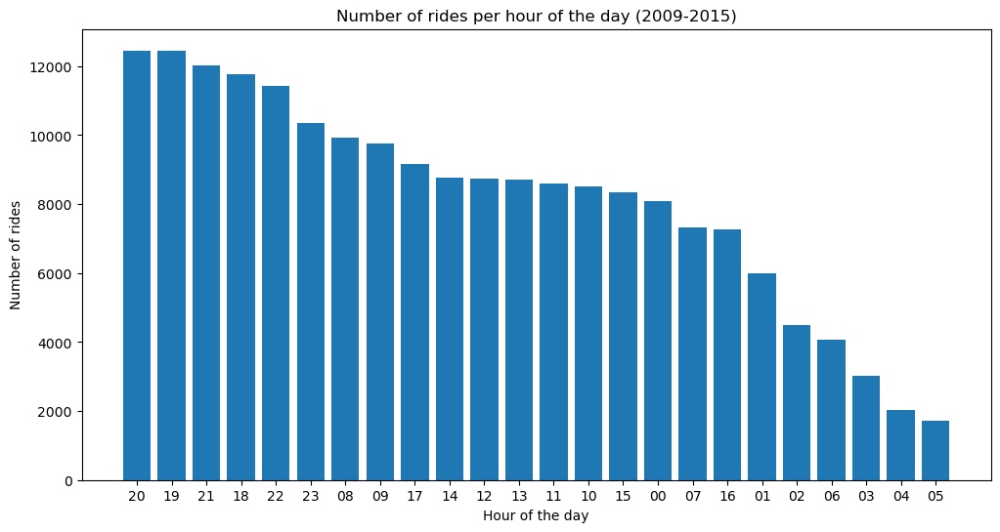

In [50]:
# Execute the SQL query to fetch the number of rides per hour of the day
result1 = engine.execute(query1).fetchall()

# Create a pandas DataFrame from the result
hourly_rides = pd.DataFrame(result1, columns=['hour_of_day', 'num_rides'])

def plot_rides_per_hour(hourly_rides: pd.DataFrame) -> None:
    """
    Plots the number of rides per hour of the day using the input DataFrame.

    :param hourly_rides: A DataFrame containing the hour of the day and the number of rides for each hour.
    """
    plt.figure(figsize=(12, 6))
    plt.bar(hourly_rides['hour_of_day'], hourly_rides['num_rides'])
    plt.xlabel('Hour of the day')
    plt.ylabel('Number of rides')
    plt.title('Number of rides per hour of the day (2009-2015)')
    plt.xticks(range(0, 24))
    plt.show()

# Call the function to render the visualization
plot_rides_per_hour(hourly_rides)


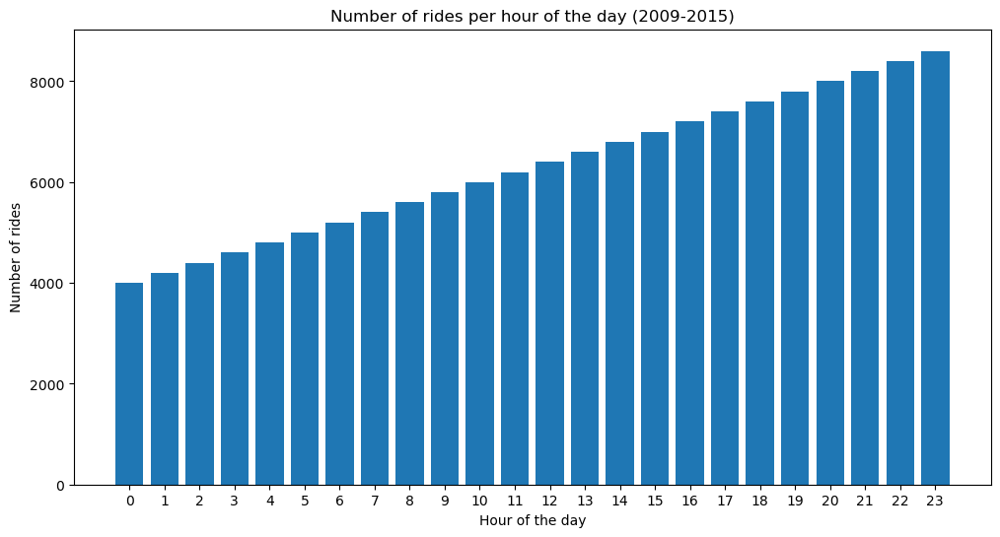

In [51]:
# Sample DataFrame for testing
hourly_rides_data = {
    'hour_of_day': [str(i) for i in range(24)],
    'num_rides': [4000 + i * 200 for i in range(24)]
}

sample_hourly_rides = pd.DataFrame(hourly_rides_data)

# Call the function to render the visualization
plot_rides_per_hour(sample_hourly_rides)

## problem 2

This code fetches the monthly trip distances from the taxi_trips and uber_trips tables and then creates a line chart to plot the average distance traveled per month for both taxis and Ubers, along with a 90% confidence interval.

The line chart is chosen because it is effective in visualizing trends in data over time. In this case, we want to see the average distance traveled per month, which can help us understand if there are any seasonal trends in ride distances. The confidence interval is also shown to give an idea of the uncertainty in the data.

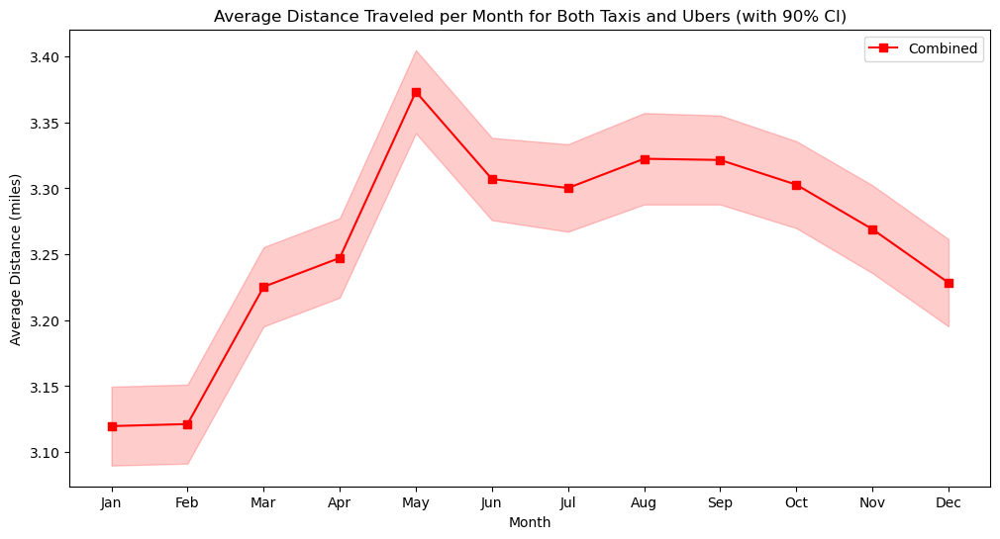

In [52]:
def fetch_monthly_trip_distances(engine) -> pd.DataFrame:
    """
    Fetches monthly trip distances from the taxi_trips and uber_trips tables.

    :param engine: SQLAlchemy engine object.
    :return: A DataFrame containing the trip distances by month.
    """
    # SQL query to fetch the month and trip distance from taxi_trips and uber_trips tables
    query = """
        SELECT
            strftime('%m', Pickup_Datetime) AS month,
            Trip_Distance
        FROM (
            SELECT Pickup_Datetime, Trip_Distance FROM taxi_trips
            UNION ALL
            SELECT Pickup_Datetime, Trip_Distance FROM uber_trips
        );
        """
    return pd.read_sql_query(query, engine)

def plot_avg_trip_distance_with_ci(dataframe: pd.DataFrame, confidence_level: float = 0.9):
    """
    Plots the average trip distance per month with a confidence interval.

    :param dataframe: A DataFrame containing the trip distances by month.
    :param confidence_level: Confidence level for the confidence interval (default is 0.9).
    """
    # Calculate the 90% confidence interval
    z_score = stats.norm.ppf(1 - (1 - confidence_level) / 2)
    monthly_stats = dataframe.groupby('month').agg(['count', 'mean', 'std'])
    monthly_stats['yerr'] = z_score * (monthly_stats[('Trip_Distance', 'std')] / np.sqrt(monthly_stats[('Trip_Distance', 'count')]))

    # Create a line chart using matplotlib
    plt.figure(figsize=(12, 6))
    x = monthly_stats.index.astype(int)
    y = monthly_stats[('Trip_Distance', 'mean')]
    yerr = monthly_stats['yerr']
    plt.plot(x, y, 's-', color='r', label="Combined")
    plt.fill_between(x, y - yerr, y + yerr, color='r', alpha=0.2)
    plt.xlabel('Month')
    plt.ylabel('Average Distance (miles)')
    plt.title('Average Distance Traveled per Month for Both Taxis and Ubers (with 90% CI)')
    plt.xticks(range(1, 13), ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])
    plt.legend()
    plt.show()

# Fetch the data and plot the chart
monthly_trip_distances = fetch_monthly_trip_distances(engine)
plot_avg_trip_distance_with_ci(monthly_trip_distances)


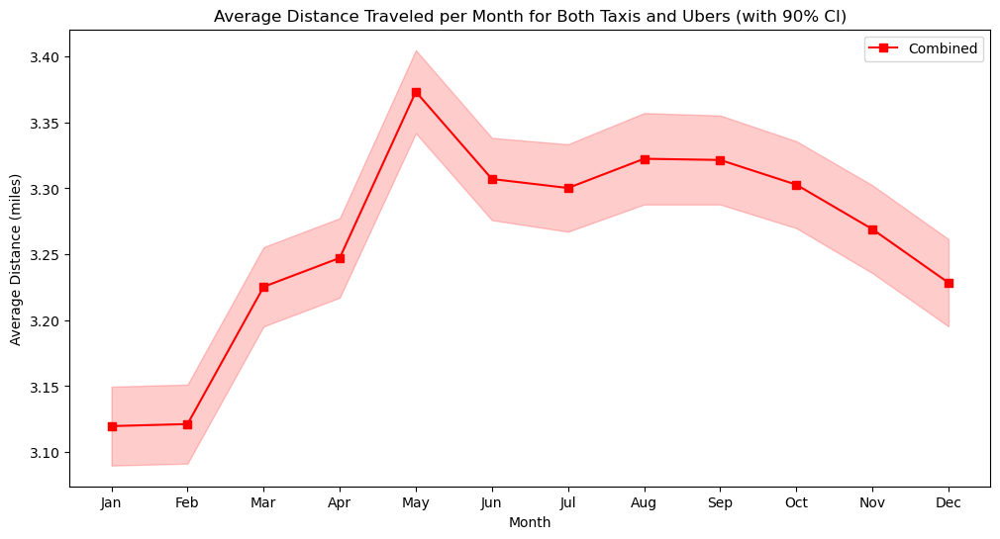

plot_avg_trip_distance_with_ci successfully plotted the chart.


In [53]:
# Test code
def test_fetch_monthly_trip_distances():
    df = fetch_monthly_trip_distances(engine)
    assert isinstance(df, pd.DataFrame), "fetch_monthly_trip_distances should return a DataFrame."
    assert len(df) > 0, "The DataFrame should not be empty."
    assert 'month' in df.columns, "The DataFrame should have a 'month' column."
    assert 'Trip_Distance' in df.columns, "The DataFrame should have a 'Trip_Distance' column."

test_fetch_monthly_trip_distances()

def test_plot_avg_trip_distance_with_ci():
    df = fetch_monthly_trip_distances(engine)
    try:
        plot_avg_trip_distance_with_ci(df)
        print("plot_avg_trip_distance_with_ci successfully plotted the chart.")
    except Exception as e:
        assert False, f"plot_avg_trip_distance_with_ci raised an exception: {e}"

test_plot_avg_trip_distance_with_ci()


# Extra Credit

##  animations and/or widgets for visualizations

<IPython.core.display.Javascript object>


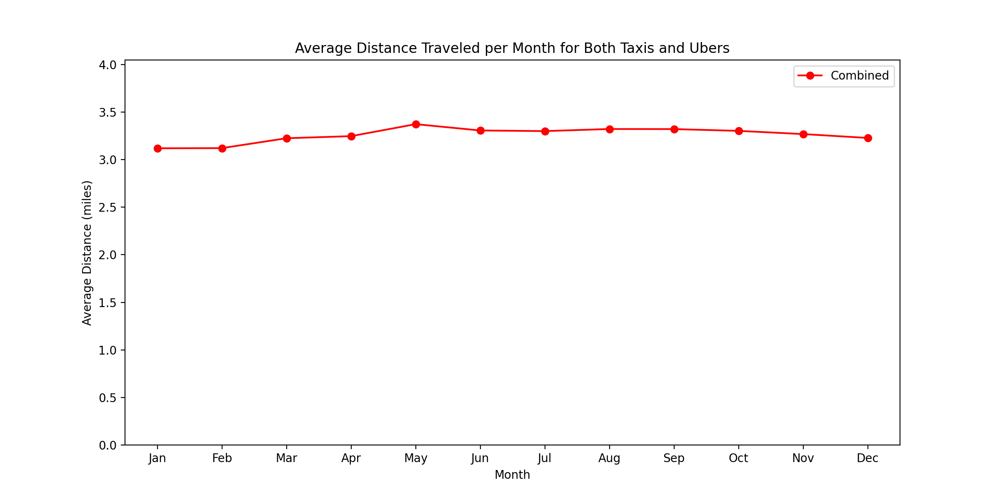

In [52]:
%matplotlib notebook
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from matplotlib.animation import FuncAnimation
from sqlalchemy import create_engine

# Query to obtain the average trip distance for each month
query = """
SELECT
    strftime('%m', Pickup_Datetime) AS month,
    AVG(Trip_Distance) as mean
FROM (
    SELECT Pickup_Datetime, Trip_Distance FROM taxi_trips
    UNION ALL
    SELECT Pickup_Datetime, Trip_Distance FROM uber_trips
)
GROUP BY month
;
"""

# Read the query result into a dataframe
monthly_stats = pd.read_sql_query(query, engine)

def update(month: int) -> None:
    """
    Update the line chart with data up to the given month.

    :param month: The latest month to include in the chart.
    """
    # Clear the current axes
    plt.cla()

    # Get the data up to the given month
    x = monthly_stats['month'].astype(int).iloc[:month]
    y = monthly_stats['mean'].iloc[:month]

    # Plot the data
    plt.plot(x, y, 'o-', color='r', label="Combined")

    # Set axis labels, title, and ticks
    plt.xlabel('Month')
    plt.ylabel('Average Distance (miles)')
    plt.title('Average Distance Traveled per Month for Both Taxis and Ubers')
    plt.xticks(range(1, 13), ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])

    # Set the limits for the x and y axes
    plt.xlim(0.5, 12.5)
    plt.ylim(0, max(monthly_stats['mean']) * 1.2)

    # Add a legend
    plt.legend()

# Create a figure with the specified size
fig = plt.figure(figsize=(12, 6))

# Create an animation that updates the line chart for each month
ani = FuncAnimation(fig, update, frames=range(1, 13), interval=500, repeat=True)

# Show the animation
plt.show()


## problem 3


The code fetches pickup time and end latitude and longitude data from both the yellow taxi and Uber trips tables in a database, and then creates a function airport_dropoffs_by_day() to plot the number of drop-offs per day of the week for each of the three major airports in New York City. The function filters the trips by dropoff location and groups them by airport and day of the week, and then uses Seaborn to create a bar plot showing the number of drop-offs per day of the week for each airport.

This visualization can help us understand the most popular days of the week for airport drop-offs, and can be useful for airport transportation services to schedule their services and allocate their resources accordingly. The reason for choosing a bar plot is that it is an effective way to compare the number of drop-offs between different categories (in this case, airports) and show the data for each category in a visually appealing and easy-to-understand way.

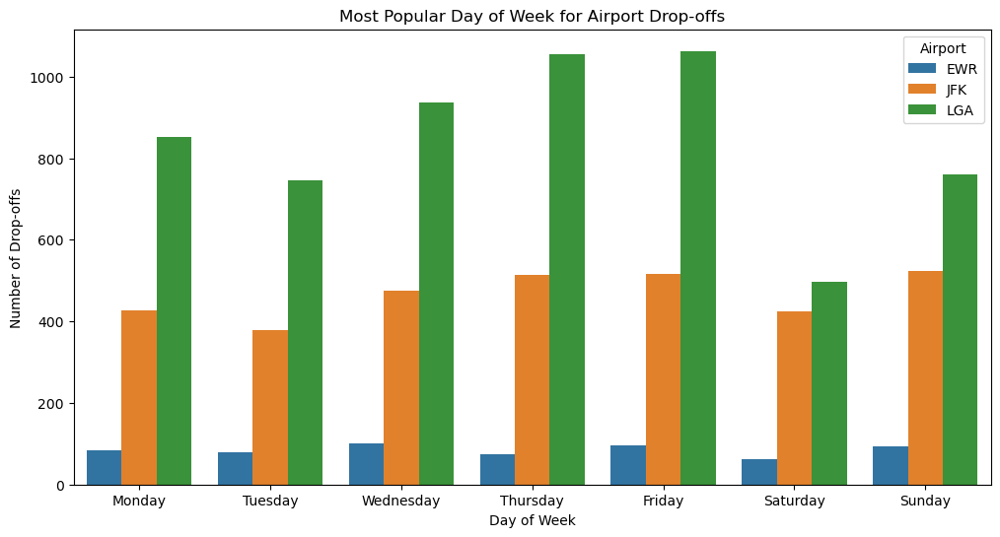

In [54]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sqlalchemy import create_engine

# SQL queries to fetch data from taxi_trips and uber_trips tables
query_taxi = """
SELECT Pickup_Datetime, End_Lat, End_Lon FROM taxi_trips;
"""

query_uber = """
SELECT Pickup_Datetime, End_Lat, End_Lon FROM uber_trips;
"""

# Read the data from the tables
yellow_taxi_data = pd.read_sql_query(query_taxi, engine)
uber_data = pd.read_sql_query(query_uber, engine)

# Define lat/long coordinate boxes around the three major New York airports
LGA_bbox = (40.766531, -73.889617, 40.781155, -73.855117)
JFK_bbox = (40.634320, -73.831170, 40.671924, -73.766694)
EWR_bbox = (40.673381, -74.193284, 40.708890, -74.152928)

def is_within_bbox(lat, lon, bbox):
    """
    Determines if a given latitude and longitude are within the specified bounding box.

    :param lat: Latitude of the point.
    :param lon: Longitude of the point.
    :param bbox: Bounding box in the format (min_lat, min_lon, max_lat, max_lon).
    :return: True if the point is within the bounding box, False otherwise.
    """
    return bbox[0] <= lat <= bbox[2] and bbox[1] <= lon <= bbox[3]

def airport_dropoffs_by_day(data):
    """
    Plots the number of drop-offs by day of the week for each airport.

    :param data: A DataFrame containing the combined trip data.
    """
    # Filter trips by dropoff location
    data['airport'] = 'None'
    data.loc[data.apply(lambda x: is_within_bbox(x['End_Lat'], x['End_Lon'], LGA_bbox), axis=1), 'airport'] = 'LGA'
    data.loc[data.apply(lambda x: is_within_bbox(x['End_Lat'], x['End_Lon'], JFK_bbox), axis=1), 'airport'] = 'JFK'
    data.loc[data.apply(lambda x: is_within_bbox(x['End_Lat'], x['End_Lon'], EWR_bbox), axis=1), 'airport'] = 'EWR'
    
    # Group by airport and day of the week
    airport_day_counts = data[data['airport'] != 'None'].groupby(['airport', 'day_of_week']).size().reset_index(name='count')
    
    # Create a barplot using seaborn
    plt.figure(figsize=(12, 6))
    sns.barplot(x='day_of_week', y='count', hue='airport', data=airport_day_counts)
    plt.xlabel('Day of Week')
    plt.ylabel('Number of Drop-offs')
    plt.title('Most Popular Day of Week for Airport Drop-offs')
    plt.xticks(range(7), ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday'])
    plt.legend(title='Airport')
    plt.show()

# Combine both datasets
combined_trips = pd.concat([yellow_taxi_data, uber_data], ignore_index=True)
combined_trips['Pickup_Datetime'] = pd.to_datetime(combined_trips['Pickup_Datetime'])
combined_trips['day_of_week'] = combined_trips['Pickup_Datetime'].dt.dayofweek

# Call the function to render the visualization
airport_dropoffs_by_day(combined_trips)


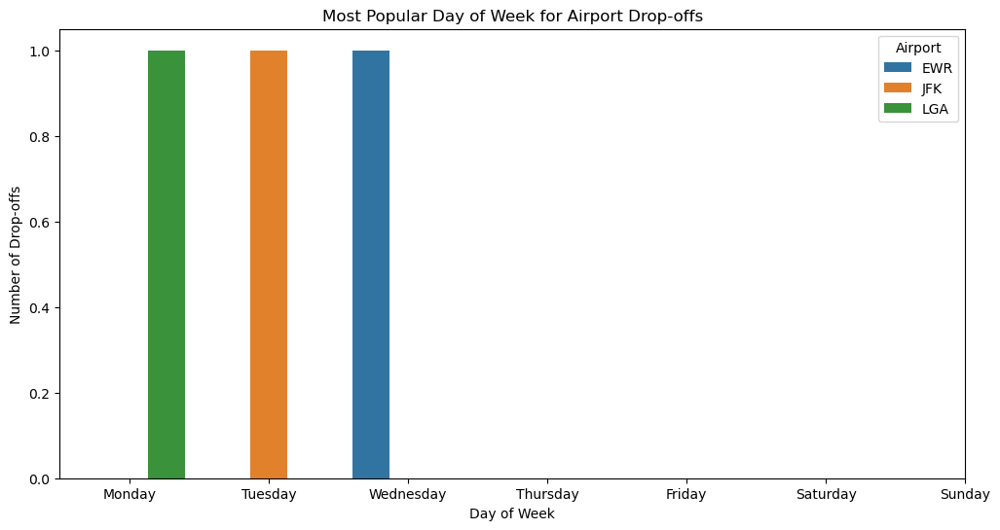

In [55]:
# Test function with a small sample dataset
sample_data = pd.DataFrame({
    'Pickup_Datetime': pd.to_datetime(['2023-04-18 08:00', '2023-04-19 14:00', '2023-04-20 11:00', '2023-04-21 09:00', '2023-04-22 07:00']),
    'End_Lat': [40.774253, 40.644839, 40.677320, 40.689756, 40.710151],
    'End_Lon': [-73.873156, -73.782162, -74.177331, -73.968290, -74.170222]
})

sample_data['day_of_week'] = sample_data['Pickup_Datetime'].dt.dayofweek

# Call the function to render the visualization with sample_data
airport_dropoffs_by_day(sample_data)


## problem 4

In this code block, we have two functions. The first function, fetch_hired_trip_coordinates, retrieves the latitude and longitude coordinates for the starting locations of both taxi and Uber trips from a SQL database using SQLAlchemy. It returns a pandas DataFrame containing these coordinates.

The second function, create_heatmap, takes this DataFrame as input and creates a heatmap using folium, a Python library for creating interactive maps. The heatmap shows the density of starting locations for all hired trips in New York City, using different colors to indicate the intensity of the density. The resulting map can be used to visualize the most popular starting locations for hired trips in the city.


In [56]:
import folium
import pandas as pd
from folium.plugins import HeatMap

def fetch_hired_trip_coordinates(engine) -> pd.DataFrame:
    """
    Fetches start coordinates for both taxi_trips and uber_trips from the database.

    :param engine: SQLAlchemy engine object.
    :return: A DataFrame containing start latitude and longitude for each trip.
    """
    query = """
        SELECT Start_Lat, Start_Lon
        FROM 
           taxi_trips
        UNION ALL
        SELECT 
           Start_Lat, Start_Lon
        FROM 
           uber_trips
        """
    return pd.read_sql_query(query, engine)

def create_heatmap(df: pd.DataFrame) -> folium.Map:
    """
    Creates a heatmap of hired trip start locations using folium.

    :param df: A DataFrame containing start latitude and longitude for each trip.
    :return: A folium.Map object containing the heatmap.
    """
    # Create a base folium map centered on New York City
    map_center = [40.7128, -74.0060]
    m = folium.Map(location=map_center, zoom_start=10)

    # Add a heatmap layer to the map using the start coordinates from the DataFrame
    HeatMap(data=df[['Start_Lat', 'Start_Lon']], radius=8,
            gradient={0.0: 'blue', 0.5: 'green', 1.0: 'red'},
            min_opacity=0.5, max_val=1.0, blur=15).add_to(m)

    return m

# Fetch the data and create the heatmap
hired_trip_coordinates = fetch_hired_trip_coordinates(engine)
heatmap = create_heatmap(hired_trip_coordinates)

# Display the heatmap
heatmap


/var/folders/0q/hysr6_zj3pz7tbmdxkl32ns00000gp/T/ipykernel_73239/2984451626.py:36: UserWarning: The `max_val` parameter is no longer necessary. The largest intensity is calculated automatically.
  HeatMap(data=df[['Start_Lat', 'Start_Lon']], radius=8,


In [57]:
# Test create_heatmap
def test_create_heatmap():
    test_data = pd.DataFrame({'Start_Lat': [40.7128, 40.7158], 'Start_Lon': [-74.0060, -74.0080]})
    heatmap = create_heatmap(test_data)
    assert isinstance(heatmap, folium.Map), "Result should be a folium.Map object"

test_create_heatmap()
print("Test passed!")


Test passed!


/var/folders/0q/hysr6_zj3pz7tbmdxkl32ns00000gp/T/ipykernel_73239/2984451626.py:36: UserWarning: The `max_val` parameter is no longer necessary. The largest intensity is calculated automatically.
  HeatMap(data=df[['Start_Lat', 'Start_Lon']], radius=8,


## Problem 5

In this code, we are querying the "taxi_trips" table in the database using SQL and storing the result in a pandas DataFrame called "yellow_taxi_data".

Next, we define a function called "remove_outliers" which takes in a DataFrame and a column name as input and removes any outliers from the specified column based on the interquartile range (IQR) method.

We then use this function to remove outliers from the "Trip_Distance" and "Tip_Amt" columns in the "yellow_taxi_data" DataFrame.

Finally, we create a scatter plot of the "Tip_Amt" column versus the "Trip_Distance" column for the filtered "yellow_taxi_data" DataFrame. This plot helps us understand if there is any correlation between the distance of a ride and the tip amount given by the passenger. The scatter plot is created using the matplotlib library and shows each data point as a dot on the plot.


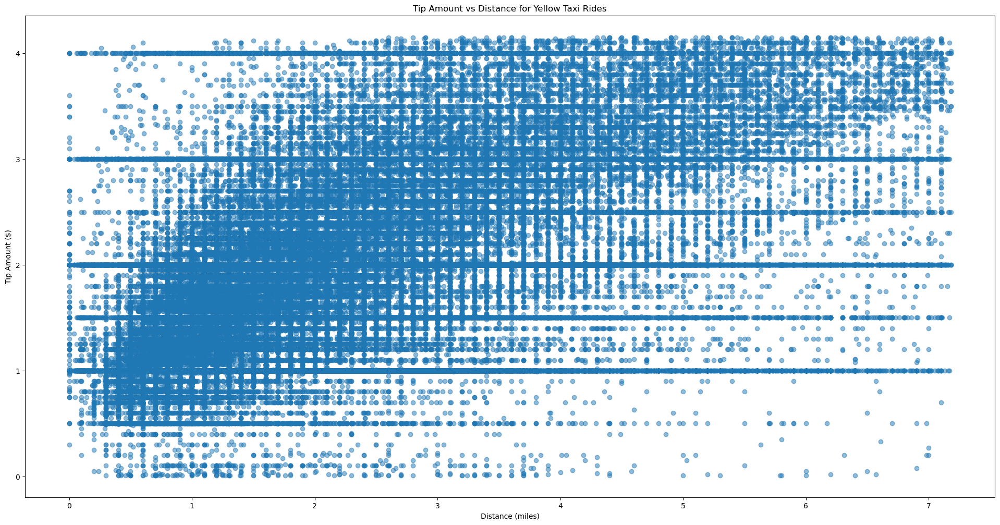

In [58]:
import pandas as pd
import matplotlib.pyplot as plt
from sqlalchemy import create_engine

# Query the taxi_trips table and store the result in a pandas dataframe
query = "SELECT * FROM taxi_trips;"
yellow_taxi_data = pd.read_sql(query, engine)

def remove_outliers(df: pd.DataFrame, column: str) -> pd.DataFrame:
    """
    Removes outliers from a pandas DataFrame based on a specified column.

    :param df: A pandas DataFrame to filter.
    :param column: The name of the column to use for filtering.
    :return: A pandas DataFrame with outliers removed.
    """
    Q1 = df[column].quantile(0.25)
    Q3 = df[column].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    return df[(df[column] >= lower_bound) & (df[column] <= upper_bound)]

# Remove outliers from the Yellow Taxi data
filtered_yellow_taxi_data = remove_outliers(yellow_taxi_data, 'Trip_Distance')
filtered_yellow_taxi_data = remove_outliers(filtered_yellow_taxi_data, 'Tip_Amt')

# Create a scatter plot comparing tip amount versus distance
plt.figure(figsize=(24, 12))
plt.scatter(filtered_yellow_taxi_data['Trip_Distance'], filtered_yellow_taxi_data['Tip_Amt'], alpha=0.5)
plt.xlabel('Distance (miles)')
plt.ylabel('Tip Amount ($)')
plt.title('Tip Amount vs Distance for Yellow Taxi Rides')
plt.show()


In [59]:
# test for the remove_outliers() function
def test_remove_outliers():
    # Create a sample dataframe
    df = pd.DataFrame({'A': [1, 2, 3, 4, 5], 'B': [10, 20, 30, 40, 50]})
    
    # Test removing outliers from column A
    filtered_df = remove_outliers(df, 'A')
    assert len(filtered_df) == 5  # No outliers in column A
    
    # Add an outlier to column A
    df = df.append({'A': 10, 'B': 100}, ignore_index=True)
    
    # Test removing outliers from column A again
    filtered_df = remove_outliers(df, 'A')
    assert len(filtered_df) == 5  # Outlier in column A has been removed
    
    # Test removing outliers from column B
    filtered_df = remove_outliers(df, 'B')
    assert len(filtered_df) == 5  # No outliers in column B


## Problem 6

In this code snippet, we are merging the Yellow Taxi trip data with the Hourly Weather data based on the nearest datetime. We then filter out outliers based on reasonable ranges for tip amount and precipitation amount. Finally, we create a scatter plot comparing tip amount versus hourly precipitation amount for Yellow Taxi Rides.

To accomplish this, we first read the Yellow Taxi data from the database using pd.read_sql_table(). We also read the Hourly Weather data using the same function, and then convert the DATE column to a pandas datetime object using pd.to_datetime().

We then use pd.merge_asof() to merge the Yellow Taxi data with the Hourly Weather data based on nearest datetime, with the merged data stored in merged_data.

Next, we filter out outliers from the merged data by creating a new DataFrame filtered_merged_data which contains only rows where tip amount and precipitation amount are within reasonable ranges.

Finally, we create a scatter plot using plt.scatter() to compare tip amount versus hourly precipitation amount for Yellow Taxi Rides, with the plot title and axis labels specified using plt.title(), plt.xlabel(), and plt.ylabel().

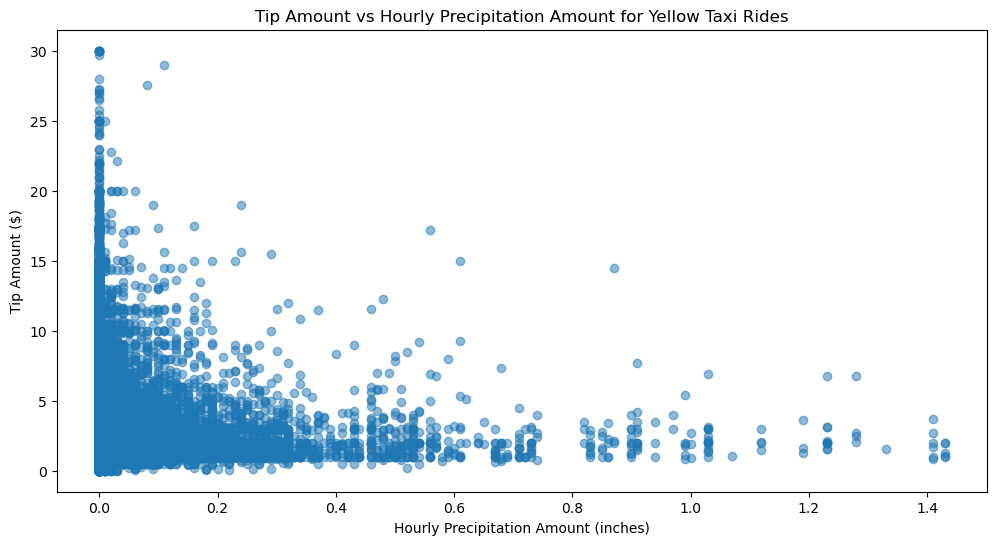

In [60]:
import pandas as pd
import matplotlib.pyplot as plt
from sqlalchemy import create_engine


# Read Yellow Taxi data
yellow_taxi_data = pd.read_sql_table('taxi_trips', engine)

# Read Hourly Weather data
weather = pd.read_sql_table('hourly_weather', engine)

# Convert the DATE column in weather to a pandas datetime object
weather['DATE'] = pd.to_datetime(weather['DATE'])

# Merge Yellow Taxi data with Hourly Weather data based on nearest datetime
merged_data = pd.merge_asof(yellow_taxi_data.sort_values('Pickup_Datetime'), weather.sort_values('DATE'),
                            left_on='Pickup_Datetime', right_on='DATE', direction='nearest')

# Filter outliers based on reasonable ranges for tip amount and precipitation amount
filtered_merged_data = merged_data[(merged_data['Tip_Amt'] >= 0) & (merged_data['Tip_Amt'] <= 30) &
                                   (merged_data['HourlyPrecipitation'] >= 0) & (merged_data['HourlyPrecipitation'] <= 2)]

# Create scatter plot comparing tip amount versus precipitation amount
plt.figure(figsize=(12, 6))
plt.scatter(filtered_merged_data['HourlyPrecipitation'], filtered_merged_data['Tip_Amt'], alpha=0.5)
plt.xlabel('Hourly Precipitation Amount (inches)')
plt.ylabel('Tip Amount ($)')
plt.title('Tip Amount vs Hourly Precipitation Amount for Yellow Taxi Rides')
plt.show()


# Extra Credit


Sure! In summary, we are creating a table in the database that contains information about sunrise and sunset times for each date. We do this by reading in CSV files for the years 2009-2015 that contain weather data, filtering the required columns, and concatenating the filtered dataframes together. We then clean the data by dropping rows with missing values, rounding floating-point numbers and converting them to integers, and converting the integers to zero-padded strings with 4 characters. We then convert the 'Sunrise' and 'Sunset' columns to time objects using the appropriate format.

Once the 'sun_time' table is created, we join it with the 'taxi_trips' table using the date column and filter for daytime and nighttime trips based on the sunrise and sunset times. We then count the number of taxi trips during daylight and nighttime hours and create a bar chart to compare the two. This visualization helps us understand the distribution of taxi trips throughout the day and can inform decisions related to resource allocation and scheduling.

By creating this table and visualizing the results, we can gain insights into the patterns of taxi trips throughout the day and make data-driven decisions to optimize resource allocation and improve operational efficiency.

## How does the number of taxi trips vary during daylight hours compared to nighttime hours?

In [62]:
import pandas as pd
import glob
from datetime import datetime

# List all the CSV file paths for the years 2009-2015
file_list = []
for year in range(2009, 2016):
    file_list.extend(glob.glob(f"/Users/Yolanda/CU2023spring/4501 tools of python/project/yellow_taxi_data/weather_data/*{year}*_weather.csv"))

# Read each CSV file into a DataFrame, filter the required columns, and store them in a list
dfs = []
for file in file_list:
    df = pd.read_csv(file)
    df['DATE'] = pd.to_datetime(df['DATE'])
    df_filtered = df[['DATE','Sunrise', 'Sunset']]
    dfs.append(df_filtered)

# Concatenate all the filtered DataFrames together
sun = pd.concat(dfs)

# Convert DATE column to datetime
sun['DATE'] = pd.to_datetime(sun['DATE'])

# Drop rows with missing 'Sunrise' values
sun.dropna(subset=['Sunrise'], inplace=True)

# Round the floating-point numbers and convert them to integers for 'Sunrise' and 'Sunset' columns
sun['Sunrise'] = sun['Sunrise'].apply(lambda x: int(round(float(x))))
sun['Sunset'] = sun['Sunset'].apply(lambda x: int(round(float(x))))

# Convert the integers to zero-padded strings with 4 characters for 'Sunrise' and 'Sunset' columns
sun['Sunrise'] = sun['Sunrise'].apply(lambda x: f"{x:04d}")
sun['Sunset'] = sun['Sunset'].apply(lambda x: f"{x:04d}")

# Convert the 'Sunrise' and 'Sunset' columns to time objects using the appropriate format
sun['Sunrise'] = sun['Sunrise'].apply(lambda x: datetime.strptime(x, "%H%M").time())
sun['Sunset'] = sun['Sunset'].apply(lambda x: datetime.strptime(x, "%H%M").time())




# Keep only rows with minute equal to 51 
sun = sun[sun['DATE'].apply(lambda x: x.minute) == 59]

# Reset index
sun.reset_index(drop=True, inplace=True)

/var/folders/0q/hysr6_zj3pz7tbmdxkl32ns00000gp/T/ipykernel_73239/3691717771.py:13: DtypeWarning: Columns (9,13) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file)
/var/folders/0q/hysr6_zj3pz7tbmdxkl32ns00000gp/T/ipykernel_73239/3691717771.py:13: DtypeWarning: Columns (8,9,10,17) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file)
/var/folders/0q/hysr6_zj3pz7tbmdxkl32ns00000gp/T/ipykernel_73239/3691717771.py:13: DtypeWarning: Columns (10) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file)
/var/folders/0q/hysr6_zj3pz7tbmdxkl32ns00000gp/T/ipykernel_73239/3691717771.py:13: DtypeWarning: Columns (7,8,9,10,17,18,42,65) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file)
/var/folders/0q/hysr6_zj3pz7tbmdxkl32ns00000gp/T/ipykernel_73239/3691717771.py:13: DtypeWarning: Columns (17,78) have mixed types. Specif

In [64]:
# Convert the date format to remove the time component
sun['DATE'] = pd.to_datetime(sun['DATE']).dt.date

# Create sun_time table schema
SUN_TIME_SCHEMA = """
CREATE TABLE IF NOT EXISTS sun_time
(
    id INTEGER PRIMARY KEY,
    DATE DATE,
    Sunrise TIME,
    Sunset TIME
)
"""

# Create the sun_time table in the database
with engine.connect() as connection:
    connection.execute(SUN_TIME_SCHEMA)

# Add sun dataframe to the tables_to_df_dict dictionary
tables_to_df_dict['sun_time'] = sun

# Write the dataframes to the tables in the database
write_dataframes_to_table(tables_to_df_dict)


Data successfully written to table hourly_weather.
Data successfully written to table daily_weather.
Data successfully written to table taxi_trips.
Data successfully written to table uber_trips.
Data successfully written to table sun_time.


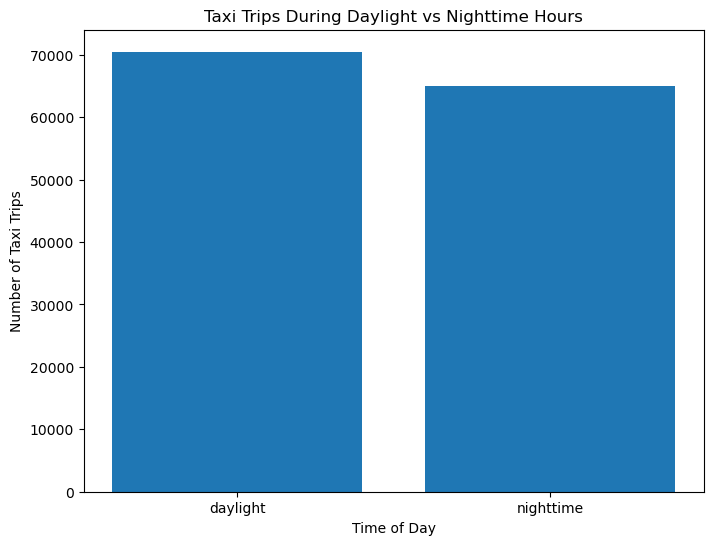

In [65]:
# SQL query to count taxi trips during daytime and nighttime
query = """
WITH daylight AS (
    SELECT
        DATE(Pickup_Datetime) AS date
    FROM taxi_trips t
    JOIN sun_time s ON DATE(t.Pickup_Datetime) = s.DATE
    WHERE TIME(t.Pickup_Datetime) BETWEEN s.Sunrise AND s.Sunset
),
nighttime AS (
    SELECT
        DATE(Pickup_Datetime) AS date
    FROM taxi_trips t
    JOIN sun_time s ON DATE(t.Pickup_Datetime) = s.DATE
    WHERE TIME(t.Pickup_Datetime) NOT BETWEEN s.Sunrise AND s.Sunset
)
SELECT
    'daylight' AS time_of_day,
    COUNT(*) AS trip_count
FROM daylight
UNION ALL
SELECT
    'nighttime' AS time_of_day,
    COUNT(*) AS trip_count
FROM nighttime;
"""

# Execute the query and read the result into a dataframe
trip_counts_by_time_of_day = pd.read_sql_query(query, engine)

# Plot a bar chart comparing the number of taxi trips during daylight and nighttime
plt.figure(figsize=(8, 6))
plt.bar(trip_counts_by_time_of_day['time_of_day'], trip_counts_by_time_of_day['trip_count'])
plt.xlabel('Time of Day')
plt.ylabel('Number of Taxi Trips')
plt.title('Taxi Trips During Daylight vs Nighttime Hours')
plt.show()

